<a href="https://colab.research.google.com/github/juanalistapablo/s-ries-temporais--sensores-falhas/blob/main/series_tmp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import  pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Read each CSV file separately
df1 = pd.read_csv('/content/dataset_parte_1.csv')
df2 = pd.read_csv('/content/dataset_parte_2.csv')
df3 = pd.read_csv('/content/dataset_parte_3.csv')
df4 = pd.read_csv('/content/dataset_parte_4.csv')
df5 = pd.read_csv('/content/dataset_parte_5.csv')
df6 = pd.read_csv('/content/dataset_parte_6.csv')
df7 = pd.read_csv('/content/dataset_parte_7.csv')

# Concatenate the two DataFrames
data = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)


/tmp/ipython-input-3434634090.py:2: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')


In [3]:
df1

,Timestamp,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,label
0,2023-09-24 00:00:00.863,-3.255208,-4.984538,-5.086263,-4.984538,-5.493164,-4.781087,-5.696614,-5.187988,-4.882812,...,-4.170735,-4.170735,-0.712077,-3.967285,-4.069010,-3.662109,-3.865560,-3.967285,-4.272461,sensor_1
1,2023-09-24 00:00:01.863,5.900065,9.155273,8.443196,9.053548,8.748372,8.036295,9.053548,8.850098,7.731120,...,5.187988,5.086263,1.118978,4.984538,5.086263,4.577637,4.679362,4.577637,4.882812,sensor_20
2,2023-09-24 00:00:02.863,7.222493,11.494954,10.375977,11.291504,10.782877,9.969075,11.189778,10.375977,9.358724,...,6.001790,6.103516,1.118978,5.798340,5.900065,5.289713,5.594889,5.289713,5.594889,sensor_28
3,2023-09-24 00:00:03.863,3.051758,5.289713,4.577637,5.187988,4.781087,4.577637,5.086263,4.577637,3.967285,...,1.831055,2.339681,0.000000,2.034505,1.831055,1.831055,1.525879,1.525879,1.831055,NaN
4,2023-09-24 00:00:04.863,0.406901,1.831055,1.118978,1.525879,1.525879,1.118978,1.729329,1.525879,1.831055,...,0.508626,0.101725,-0.305176,0.101725,0.101725,0.000000,-0.101725,-0.406901,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2023-09-25 03:46:43.468,-1.424154,-4.781087,-6.103516,-4.984538,-6.510416,-4.475911,-8.341471,-5.391438,-5.493164,...,-4.577637,-3.458659,19.836426,-3.662109,-4.374186,-2.644857,-4.577637,-3.356934,-4.781087,NaN
99996,2023-09-25 03:46:44.468,5.594889,4.069010,3.458659,3.865560,3.153483,4.374186,1.627604,4.475911,3.051758,...,6.205241,6.917317,23.091633,7.425944,7.527669,7.832845,7.019043,8.544922,6.815592,NaN
99997,2023-09-25 03:46:45.468,6.815592,5.493164,5.493164,5.493164,4.679362,5.798340,2.644857,5.594889,3.560384,...,6.510416,7.120768,22.888184,7.731120,7.832845,8.138020,7.324219,8.951822,6.917317,NaN
99998,2023-09-25 03:46:46.468,10.375977,10.375977,10.274251,10.274251,9.358724,10.172525,7.629395,10.274251,7.425944,...,9.460449,10.477701,23.905436,10.884603,11.189778,11.393229,10.477701,12.207031,9.969075,NaN


In [4]:
df4.head()

,Timestamp,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,label
0,2023-09-27 11:36:02.952,1.220703,-57.067870,-57.271320,-55.033363,-61.950684,-51.981606,-64.900710,-59.204100,-47.200520,...,-44.047035,-43.029785,83.312990,-44.555664,-50.354004,-39.672850,-48.522950,-47.709145,-48.319496,NaN
1,2023-09-27 11:36:03.952,9.867350,-46.284992,-46.183266,-44.555664,-50.862630,-42.215980,-54.016113,-48.828125,-38.655598,...,-35.909016,-34.993490,85.144040,-36.315918,-41.910805,-31.840006,-40.384926,-39.164223,-40.588380,NaN
2,2023-09-27 11:36:04.952,19.429523,-34.484863,-34.281410,-32.755530,-39.062500,-31.127930,-41.809082,-37.129720,-28.279621,...,-25.634766,-24.719238,87.483720,-25.939941,-30.822754,-22.074380,-29.602050,-28.381348,-30.008951,NaN
3,2023-09-27 11:36:05.955,31.433105,-18.208820,-17.903645,-16.276041,-22.277832,-15.665689,-24.719238,-20.243326,-13.631185,...,-12.003580,-11.291504,89.518230,-12.308756,-17.191568,-9.358724,-16.174316,-15.157063,-16.174316,NaN
4,2023-09-27 11:36:06.955,40.486652,-4.984538,-5.391438,-3.153483,-9.358724,-3.967285,-11.698404,-7.832845,-2.441406,...,-4.984538,-4.374186,90.433754,-5.900065,-10.375977,-3.763835,-9.969075,-9.562174,-9.663899,NaN


In [5]:
display(data.head())

,Timestamp,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,label
0,2023-09-24 00:00:00.863,-3.255208,-4.984538,-5.086263,-4.984538,-5.493164,-4.781087,-5.696614,-5.187988,-4.882812,...,-4.170735,-4.170735,-0.712077,-3.967285,-4.069010,-3.662109,-3.865560,-3.967285,-4.272461,sensor_1
1,2023-09-24 00:00:01.863,5.900065,9.155273,8.443196,9.053548,8.748372,8.036295,9.053548,8.850098,7.731120,...,5.187988,5.086263,1.118978,4.984538,5.086263,4.577637,4.679362,4.577637,4.882812,sensor_20
2,2023-09-24 00:00:02.863,7.222493,11.494954,10.375977,11.291504,10.782877,9.969075,11.189778,10.375977,9.358724,...,6.001790,6.103516,1.118978,5.798340,5.900065,5.289713,5.594889,5.289713,5.594889,sensor_28
3,2023-09-24 00:00:03.863,3.051758,5.289713,4.577637,5.187988,4.781087,4.577637,5.086263,4.577637,3.967285,...,1.831055,2.339681,0.000000,2.034505,1.831055,1.831055,1.525879,1.525879,1.831055,NaN
4,2023-09-24 00:00:04.863,0.406901,1.831055,1.118978,1.525879,1.525879,1.118978,1.729329,1.525879,1.831055,...,0.508626,0.101725,-0.305176,0.101725,0.101725,0.000000,-0.101725,-0.406901,0.000000,NaN


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581770 entries, 0 to 581769
Data columns (total 36 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Timestamp  581770 non-null  object 
 1   sensor_1   581770 non-null  float64
 2   sensor_2   581770 non-null  float64
 3   sensor_3   581770 non-null  float64
 4   sensor_4   581770 non-null  float64
 5   sensor_5   581770 non-null  float64
 6   sensor_6   581770 non-null  float64
 7   sensor_7   581770 non-null  float64
 8   sensor_8   581770 non-null  float64
 9   sensor_9   581770 non-null  float64
 10  sensor_10  581769 non-null  float64
 11  sensor_11  581769 non-null  float64
 12  sensor_12  581769 non-null  float64
 13  sensor_13  581769 non-null  float64
 14  sensor_14  581769 non-null  float64
 15  sensor_15  581769 non-null  float64
 16  sensor_16  581769 non-null  float64
 17  sensor_17  581769 non-null  float64
 18  sensor_18  581769 non-null  float64
 19  sensor_19  581769 non-n

In [7]:
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

In [8]:
data

,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,...,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,label
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-09-24 00:00:00.863,-3.255208,-4.984538,-5.086263,-4.984538,-5.493164,-4.781087,-5.696614,-5.187988,-4.882812,-4.882812,...,-4.170735,-4.170735,-0.712077,-3.967285,-4.069010,-3.662109,-3.865560,-3.967285,-4.272461,sensor_1
2023-09-24 00:00:01.863,5.900065,9.155273,8.443196,9.053548,8.748372,8.036295,9.053548,8.850098,7.731120,7.934570,...,5.187988,5.086263,1.118978,4.984538,5.086263,4.577637,4.679362,4.577637,4.882812,sensor_20
2023-09-24 00:00:02.863,7.222493,11.494954,10.375977,11.291504,10.782877,9.969075,11.189778,10.375977,9.358724,9.765625,...,6.001790,6.103516,1.118978,5.798340,5.900065,5.289713,5.594889,5.289713,5.594889,sensor_28
2023-09-24 00:00:03.863,3.051758,5.289713,4.577637,5.187988,4.781087,4.577637,5.086263,4.577637,3.967285,3.967285,...,1.831055,2.339681,0.000000,2.034505,1.831055,1.831055,1.525879,1.525879,1.831055,NaN
2023-09-24 00:00:04.863,0.406901,1.831055,1.118978,1.525879,1.525879,1.118978,1.729329,1.525879,1.831055,1.017253,...,0.508626,0.101725,-0.305176,0.101725,0.101725,0.000000,-0.101725,-0.406901,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-30 23:59:55.144,324.707030,225.931800,234.375000,224.914550,237.121580,224.100740,208.435060,231.831860,230.509430,231.628420,...,229.288730,215.454100,540.873170,212.605790,230.305980,218.404130,234.476720,234.171540,236.511230,NaN
2023-09-30 23:59:56.144,328.470860,231.424960,239.969880,230.305980,243.123370,229.187010,214.436840,237.630200,235.595700,237.223300,...,235.290530,220.947270,541.992200,218.607570,236.918120,224.609380,240.987140,240.681960,242.818190,NaN
2023-09-30 23:59:57.144,328.470860,230.509430,239.868160,229.695630,242.716460,229.187010,214.335110,237.935380,235.595700,238.342290,...,238.037110,224.100740,543.111150,222.066240,240.376790,227.457670,244.445800,244.242340,246.480300,NaN


In [9]:
sensor_columns = ['sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5', 'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29', 'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34']
data[sensor_columns][data[sensor_columns].isna()]

,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,...,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-09-24 00:00:00.863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-24 00:00:01.863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-24 00:00:02.863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-24 00:00:03.863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-24 00:00:04.863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-30 23:59:55.144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-30 23:59:56.144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-30 23:59:57.144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
data['label_binary'] = data['label'].notna().astype(int)
display(data[['label', 'label_binary']].head())

,label,label_binary
Timestamp,,
2023-09-24 00:00:00.863,sensor_1,1
2023-09-24 00:00:01.863,sensor_20,1
2023-09-24 00:00:02.863,sensor_28,1
2023-09-24 00:00:03.863,NaN,0
2023-09-24 00:00:04.863,NaN,0


In [11]:
display(data.index[data.index.isnull()])

DatetimeIndex([], dtype='datetime64[ns]', name='Timestamp', freq=None)

In [12]:
data = data.drop('label', axis=1)
display(data.head())

,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,...,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,label_binary
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-09-24 00:00:00.863,-3.255208,-4.984538,-5.086263,-4.984538,-5.493164,-4.781087,-5.696614,-5.187988,-4.882812,-4.882812,...,-4.170735,-4.170735,-0.712077,-3.967285,-4.069010,-3.662109,-3.865560,-3.967285,-4.272461,1
2023-09-24 00:00:01.863,5.900065,9.155273,8.443196,9.053548,8.748372,8.036295,9.053548,8.850098,7.731120,7.934570,...,5.187988,5.086263,1.118978,4.984538,5.086263,4.577637,4.679362,4.577637,4.882812,1
2023-09-24 00:00:02.863,7.222493,11.494954,10.375977,11.291504,10.782877,9.969075,11.189778,10.375977,9.358724,9.765625,...,6.001790,6.103516,1.118978,5.798340,5.900065,5.289713,5.594889,5.289713,5.594889,1
2023-09-24 00:00:03.863,3.051758,5.289713,4.577637,5.187988,4.781087,4.577637,5.086263,4.577637,3.967285,3.967285,...,1.831055,2.339681,0.000000,2.034505,1.831055,1.831055,1.525879,1.525879,1.831055,0
2023-09-24 00:00:04.863,0.406901,1.831055,1.118978,1.525879,1.525879,1.118978,1.729329,1.525879,1.831055,1.017253,...,0.508626,0.101725,-0.305176,0.101725,0.101725,0.000000,-0.101725,-0.406901,0.000000,0


In [13]:
import matplotlib.pyplot as plt

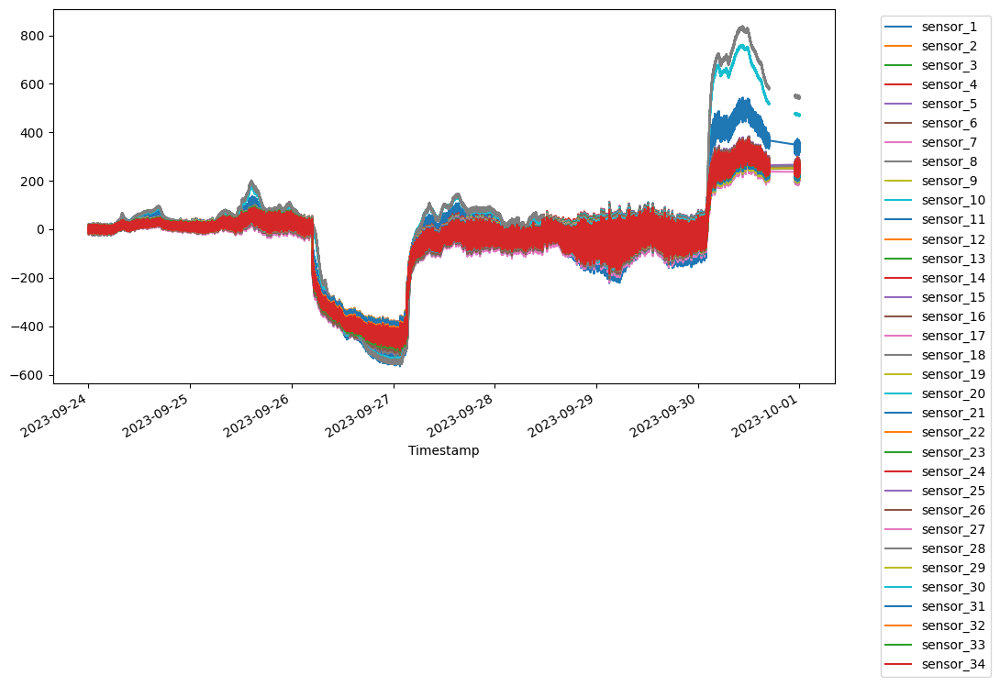

In [14]:
data[sensor_columns].plot(figsize=(11,6))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

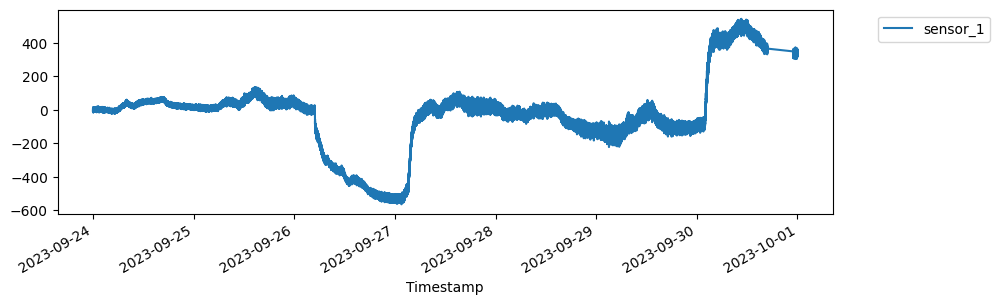

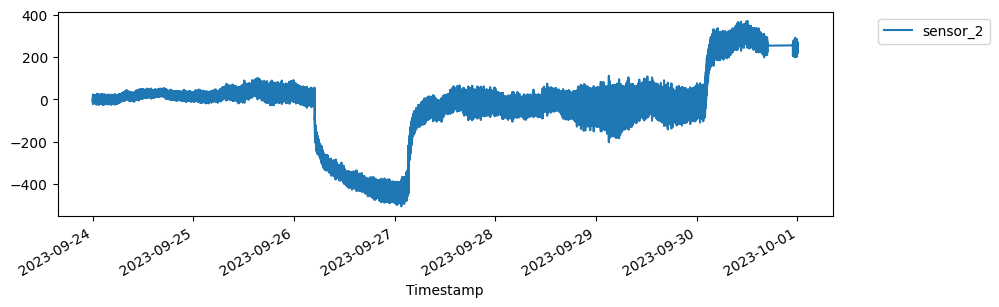

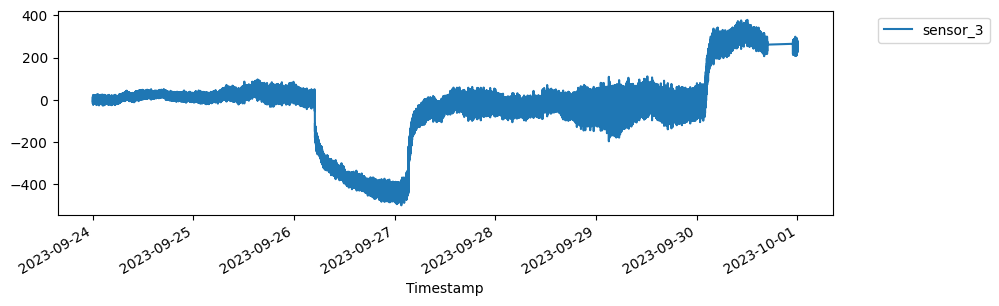

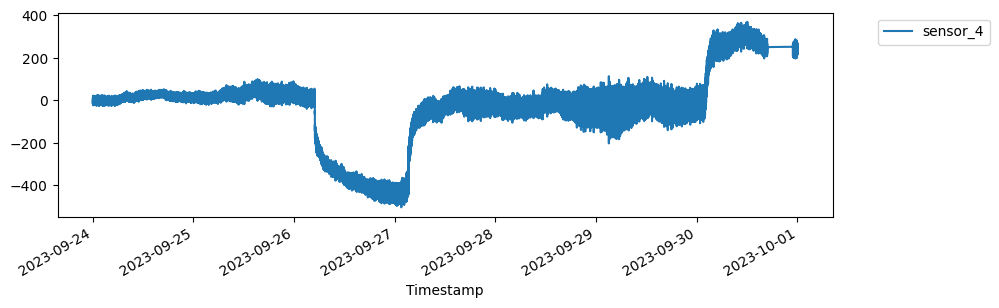

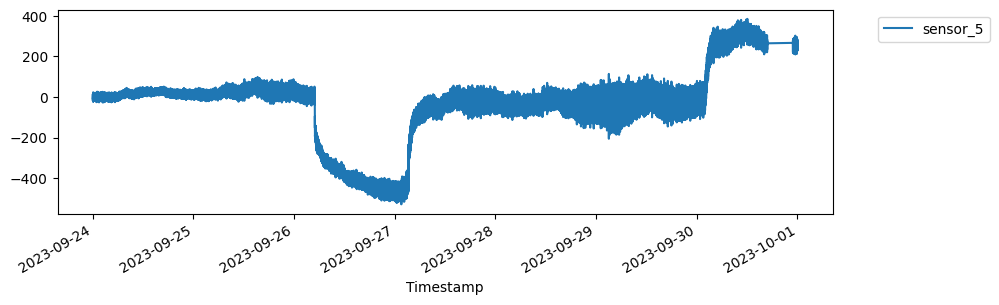

...

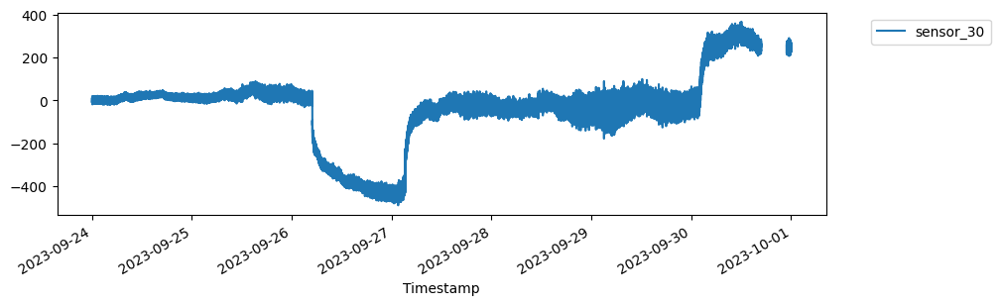

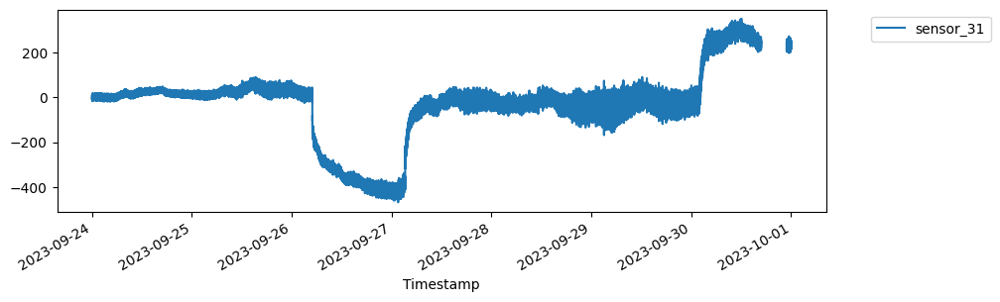

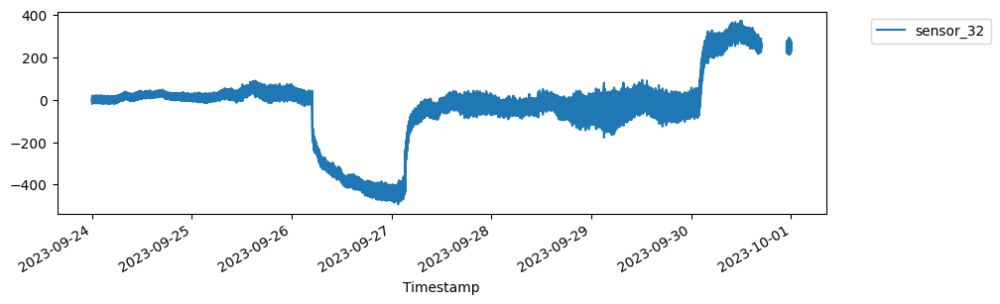

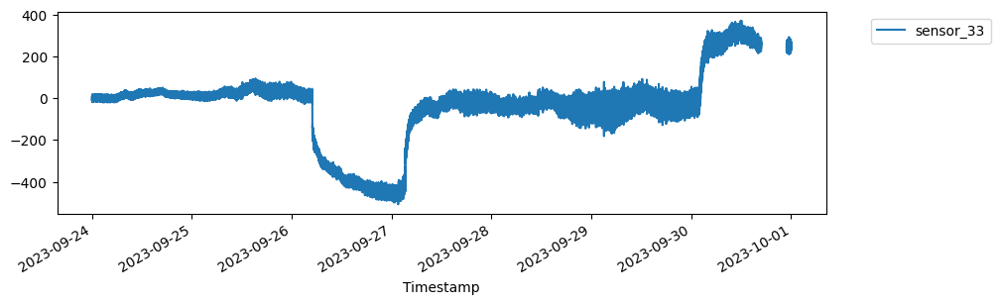

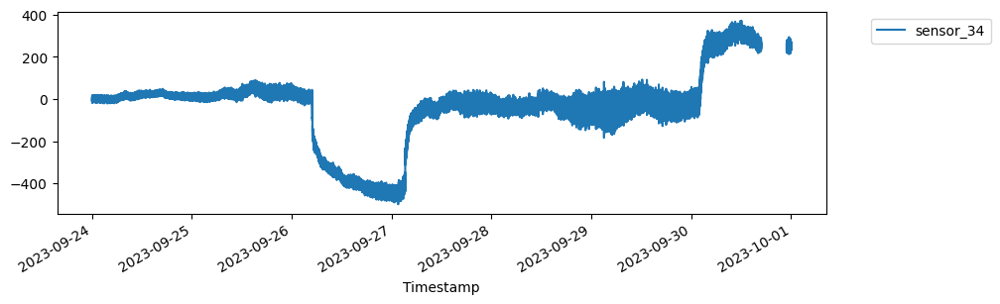

In [15]:
for i in range(1, 35):
    sensor_name = f'sensor_{i}'
    data[sensor_name].plot(figsize=(10,3))
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [19]:
print(data.columns)

Index(['sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5', 'sensor_6',
       'sensor_7', 'sensor_8', 'sensor_9', 'sensor_10', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_14', 'sensor_15', 'sensor_16',
       'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21',
       'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26',
       'sensor_27', 'sensor_28', 'sensor_29', 'sensor_30', 'sensor_31',
       'sensor_32', 'sensor_33', 'sensor_34', 'label_binary'],
      dtype='object')


In [23]:
data.rename(columns={'Label': 'label'}, inplace=True)  # use o nome real que estiver lá
data['label'] = data['label'].notna().astype(int)  # se original for string ou sensor name

KeyError: 'label'

In [ ]:
def plot_all_sensors_with_anomalies(data, label_col='label', offset=0.5):
    if label_col not in data.columns:
        raise ValueError(f"Coluna '{label_col}' não encontrada no DataFrame.")

    sensor_columns = [col for col in data.columns if col.startswith('sensor_')]

    ax = data[sensor_columns].plot(figsize=(11, 6), linewidth=1)

    anomaly_indices = data[data[label_col] == 1].index
    for sensor in sensor_columns:
        y_values = data.loc[anomaly_indices, sensor] + offset
        ax.scatter(anomaly_indices, y_values, color='red', s=20,
                   label='Anomalias' if sensor == sensor_columns[0] else "", zorder=5)

    plt.xlabel('Tempo')
    plt.ylabel('Valor')
    plt.title('Todos os Sensores com Anomalias Destacadas')
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
# 1. Binarizar a coluna 'label' se necessário
data['label'] = data['label'].notna().astype(int)

# 2. Plotar
plot_all_sensors_with_anomalies(data, offset=0.7)


In [16]:
import matplotlib.pyplot as plt

def plot_all_sensors_with_anomalies(data, label_col='label', offset=0.5):
    """
    Plota todos os sensores em um único gráfico com anomalias destacadas.

    Args:
        data (pd.DataFrame): DataFrame com colunas 'sensor_i' e 'label'.
        label_col (str): Nome da coluna que indica anomalias (binária).
        offset (float): Quanto elevar os pontos vermelhos no eixo Y.
    """
    sensor_columns = [col for col in data.columns if col.startswith('sensor_')]

    # Plotar os sinais
    ax = data[sensor_columns].plot(figsize=(11, 6), linewidth=1)

    # Plotar anomalias em cada sensor com deslocamento no Y
    anomaly_indices = data[data[label_col] == 1].index
    for sensor in sensor_columns:
        # Valores deslocados
        y_values = data.loc[anomaly_indices, sensor] + offset
        ax.scatter(anomaly_indices, y_values, color='red', s=20, label='Anomalias' if sensor == sensor_columns[0] else "", zorder=5)

    plt.xlabel('Tempo')
    plt.ylabel('Valor')
    plt.title('Todos os Sensores com Anomalias Destacadas')
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # evitar legendas duplicadas
    plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-4056733243.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')


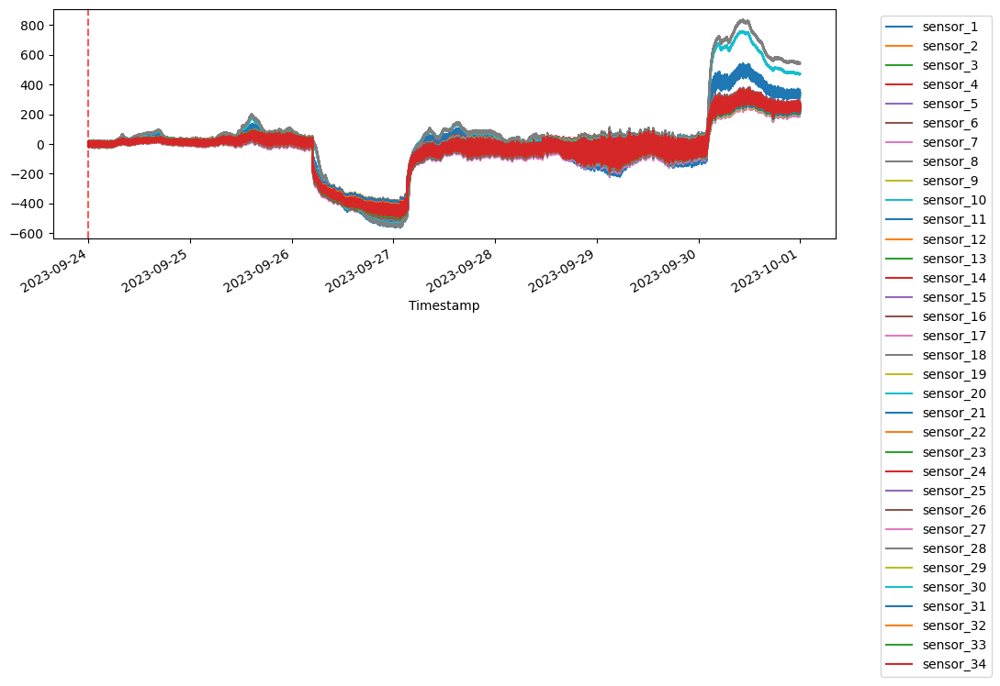

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Carregamento dos dados
df1 = pd.read_csv('/content/dataset_parte_1.csv')
df2 = pd.read_csv('/content/dataset_parte_2.csv')
df3 = pd.read_csv('/content/dataset_parte_3.csv')
df4 = pd.read_csv('/content/dataset_parte_4.csv')
df5 = pd.read_csv('/content/dataset_parte_5.csv')
df6 = pd.read_csv('/content/dataset_parte_6.csv')
df7 = pd.read_csv('/content/dataset_parte_7.csv')

data = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)

# Conversão do timestamp
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

# Criação da coluna binária
data['label_binary'] = data['label'].notna().astype(int)

# Remoção da coluna 'label'
data = data.drop('label', axis=1)

# Defina os sensores que você quer plotar (exemplo)
sensor_columns = [col for col in data.columns if col != 'label_binary']

# Plot dos sensores
ax = data[sensor_columns].plot(figsize=(11,6))

# Adiciona linhas verticais onde label_binary == 1
for timestamp in data[data['label_binary'] == 1].index:
    ax.axvline(x=timestamp, color='red', linestyle='--', alpha=0.3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


/tmp/ipython-input-998806805.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')


,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,...,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,label_binary
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-09-24 00:00:00.863,-3.255208,-4.984538,-5.086263,-4.984538,-5.493164,-4.781087,-5.696614,-5.187988,-4.882812,-4.882812,...,-4.170735,-4.170735,-0.712077,-3.967285,-4.069010,-3.662109,-3.865560,-3.967285,-4.272461,1
2023-09-24 00:00:01.863,5.900065,9.155273,8.443196,9.053548,8.748372,8.036295,9.053548,8.850098,7.731120,7.934570,...,5.187988,5.086263,1.118978,4.984538,5.086263,4.577637,4.679362,4.577637,4.882812,1
2023-09-24 00:00:02.863,7.222493,11.494954,10.375977,11.291504,10.782877,9.969075,11.189778,10.375977,9.358724,9.765625,...,6.001790,6.103516,1.118978,5.798340,5.900065,5.289713,5.594889,5.289713,5.594889,1
2023-09-24 00:00:03.863,3.051758,5.289713,4.577637,5.187988,4.781087,4.577637,5.086263,4.577637,3.967285,3.967285,...,1.831055,2.339681,0.000000,2.034505,1.831055,1.831055,1.525879,1.525879,1.831055,0
2023-09-24 00:00:04.863,0.406901,1.831055,1.118978,1.525879,1.525879,1.118978,1.729329,1.525879,1.831055,1.017253,...,0.508626,0.101725,-0.305176,0.101725,0.101725,0.000000,-0.101725,-0.406901,0.000000,0


/tmp/ipython-input-998806805.py:38: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, anomaly_points[col], 'ro', markersize=3, label=f'{col} anomaly')


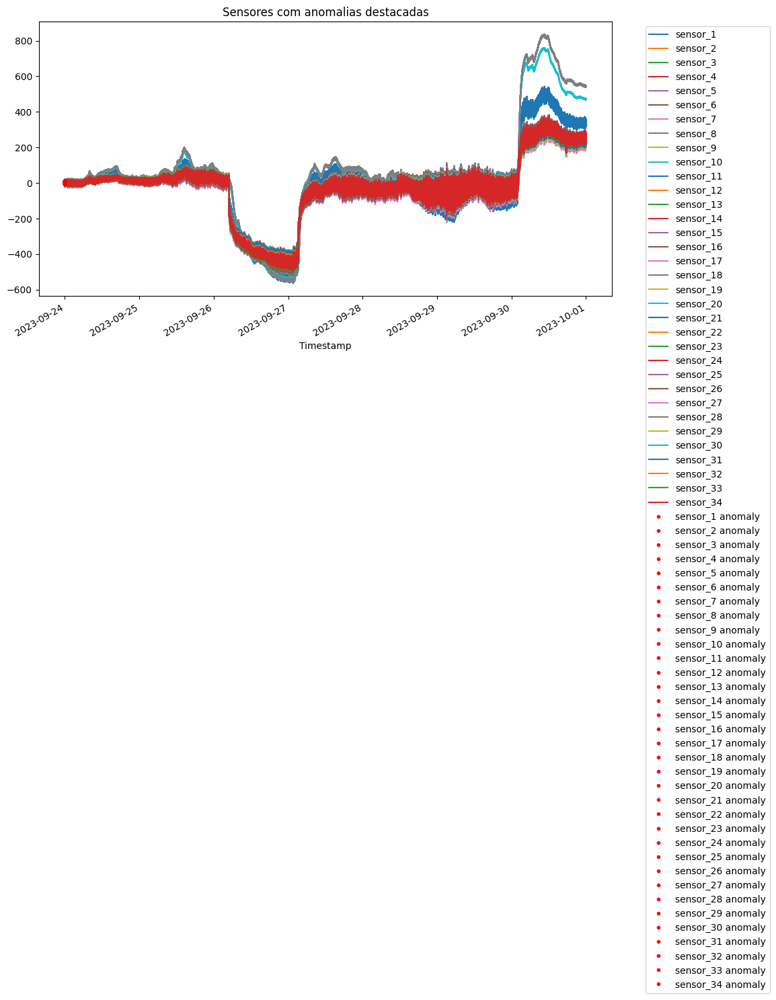

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Leitura dos arquivos CSV
df1 = pd.read_csv('/content/dataset_parte_1.csv')
df2 = pd.read_csv('/content/dataset_parte_2.csv')
df3 = pd.read_csv('/content/dataset_parte_3.csv')
df4 = pd.read_csv('/content/dataset_parte_4.csv')
df5 = pd.read_csv('/content/dataset_parte_5.csv')
df6 = pd.read_csv('/content/dataset_parte_6.csv')
df7 = pd.read_csv('/content/dataset_parte_7.csv')

# Concatenação dos dados
data = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)

# Conversão do timestamp e configuração do índice
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

# Criação da coluna label_binary
data['label_binary'] = data['label'].notna().astype(int)

# Remoção da coluna 'label'
data = data.drop('label', axis=1)

# Exibição das primeiras linhas para conferência
display(data.head())

# Defina as colunas de sensores (se ainda não estiverem definidas)
sensor_columns = [col for col in data.columns if col != 'label_binary']

# Plotagem dos sensores
ax = data[sensor_columns].plot(figsize=(11,6))

# Adição de pontos vermelhos onde label_binary == 1
anomaly_points = data[data['label_binary'] == 1]
for col in sensor_columns:
    ax.plot(anomaly_points.index, anomaly_points[col], 'ro', markersize=3, label=f'{col} anomaly')

# Ajuste da legenda
handles, labels = ax.get_legend_handles_labels()
# Remover duplicatas da legenda
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Sensores com anomalias destacadas')
plt.show()


In [27]:
ax.plot(anomaly_points.index, anomaly_points['sensor_1'], 'ro', markersize=3, label='sensor_1 anomaly')


/tmp/ipython-input-4173086773.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')
/tmp/ipython-input-4173086773.py:45: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label=f'{col} anomaly')
/tmp/ipython-input-4173086773.py:53: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


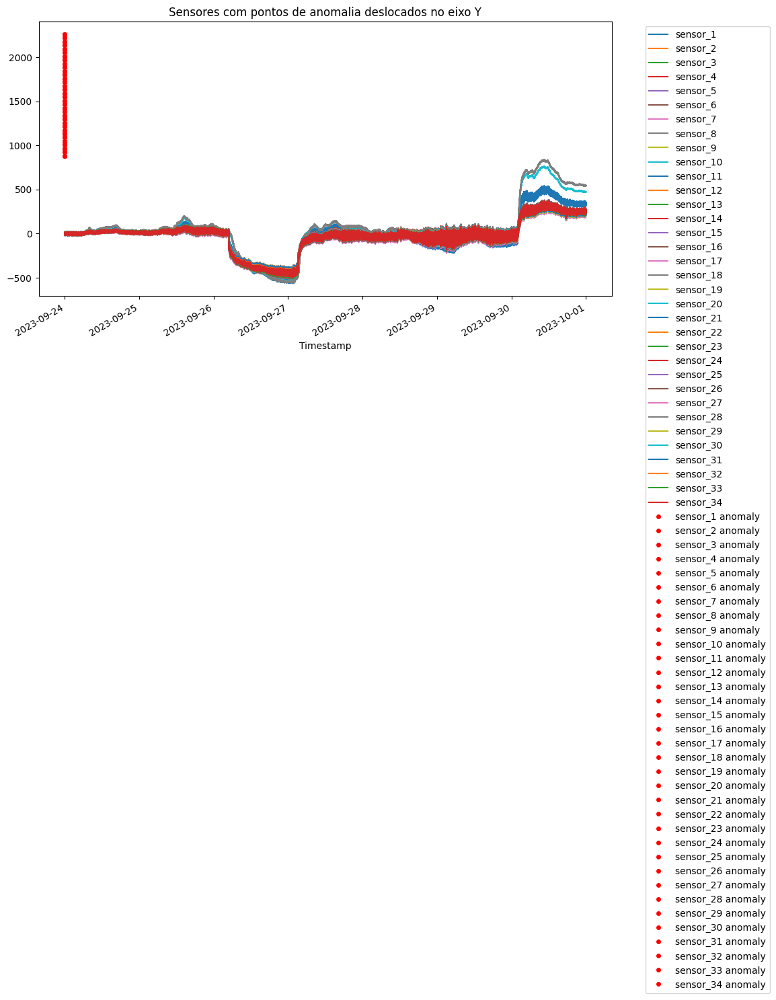

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Leitura dos arquivos CSV
df1 = pd.read_csv('/content/dataset_parte_1.csv')
df2 = pd.read_csv('/content/dataset_parte_2.csv')
df3 = pd.read_csv('/content/dataset_parte_3.csv')
df4 = pd.read_csv('/content/dataset_parte_4.csv')
df5 = pd.read_csv('/content/dataset_parte_5.csv')
df6 = pd.read_csv('/content/dataset_parte_6.csv')
df7 = pd.read_csv('/content/dataset_parte_7.csv')

# Concatenação dos dados
data = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)

# Conversão do timestamp e configuração do índice
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

# Criação da coluna label_binary
data['label_binary'] = data['label'].notna().astype(int)

# Remoção da coluna 'label'
data = data.drop('label', axis=1)

# Definir colunas dos sensores
sensor_columns = [col for col in data.columns if col != 'label_binary']

# Plot dos sensores
ax = data[sensor_columns].plot(figsize=(11,6))

# Anomalias
anomaly_points = data[data['label_binary'] == 1]

# Obter valor máximo geral dos sensores
max_val = data[sensor_columns].max().max()

# Offset entre sensores para evitar sobreposição
y_offset_base = max_val * 0.05  # 5% do valor máximo

# Adicionar pontos vermelhos deslocados no eixo Y
for i, col in enumerate(sensor_columns):
    y_offset = y_offset_base * (i + 1)
    y_pos = [max_val + y_offset] * len(anomaly_points)
    ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label=f'{col} anomaly')

# Ajuste da legenda para evitar duplicatas
handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Sensores com pontos de anomalia deslocados no eixo Y')
plt.tight_layout()
plt.show()


/tmp/ipython-input-747234960.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')
/tmp/ipython-input-747234960.py:42: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label=f'{col} anomaly')
/tmp/ipython-input-747234960.py:62: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


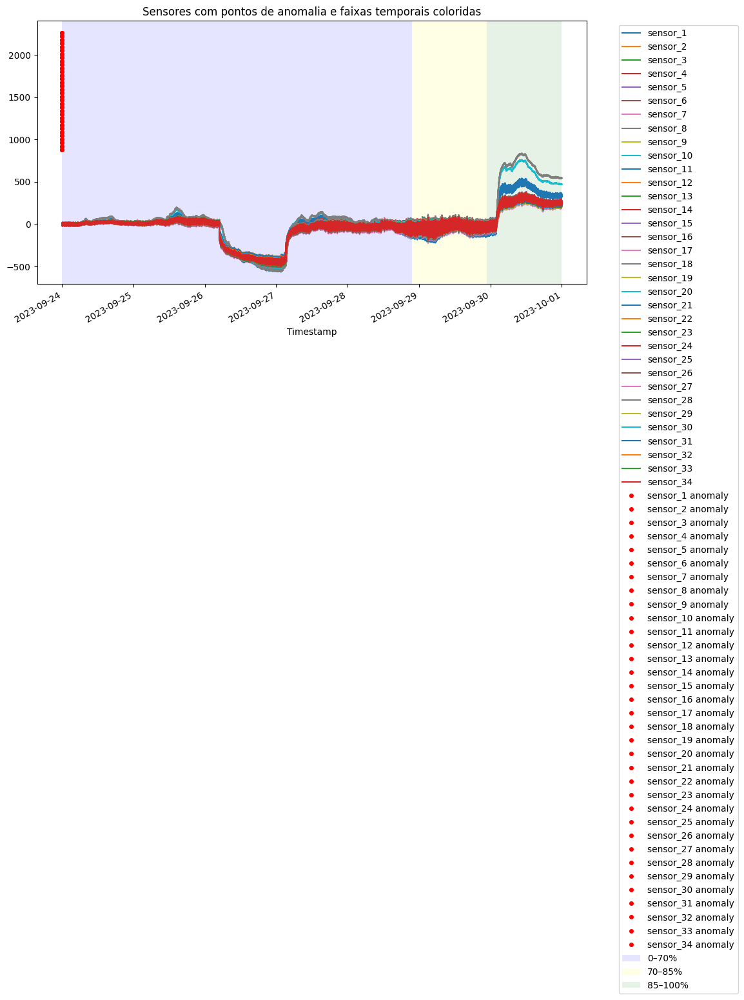

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Leitura dos arquivos CSV
df1 = pd.read_csv('/content/dataset_parte_1.csv')
df2 = pd.read_csv('/content/dataset_parte_2.csv')
df3 = pd.read_csv('/content/dataset_parte_3.csv')
df4 = pd.read_csv('/content/dataset_parte_4.csv')
df5 = pd.read_csv('/content/dataset_parte_5.csv')
df6 = pd.read_csv('/content/dataset_parte_6.csv')
df7 = pd.read_csv('/content/dataset_parte_7.csv')

# Concatenação dos dados
data = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)

# Conversão do timestamp e configuração do índice
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

# Criação da coluna label_binary
data['label_binary'] = data['label'].notna().astype(int)

# Remoção da coluna 'label'
data = data.drop('label', axis=1)

# Definir colunas dos sensores
sensor_columns = [col for col in data.columns if col != 'label_binary']

# Plot dos sensores
fig, ax = plt.subplots(figsize=(11,6))
data[sensor_columns].plot(ax=ax)

# Anomalias
anomaly_points = data[data['label_binary'] == 1]
max_val = data[sensor_columns].max().max()
y_offset_base = max_val * 0.05

# Adicionar pontos vermelhos elevados
for i, col in enumerate(sensor_columns):
    y_offset = y_offset_base * (i + 1)
    y_pos = [max_val + y_offset] * len(anomaly_points)
    ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label=f'{col} anomaly')

# Divisão do eixo X em 70/15/15%
timestamps = data.index
n = len(timestamps)
t1 = timestamps[int(n * 0.7)]
t2 = timestamps[int(n * 0.85)]
t3 = timestamps[-1]

# Faixas coloridas no fundo do gráfico
ax.axvspan(timestamps[0], t1, facecolor='blue', alpha=0.1, label='0–70%')
ax.axvspan(t1, t2, facecolor='yellow', alpha=0.1, label='70–85%')
ax.axvspan(t2, t3, facecolor='green', alpha=0.1, label='85–100%')

# Ajuste da legenda para evitar duplicatas
handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Sensores com pontos de anomalia e faixas temporais coloridas')
plt.tight_layout()
plt.show()


/tmp/ipython-input-2718382829.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')
/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


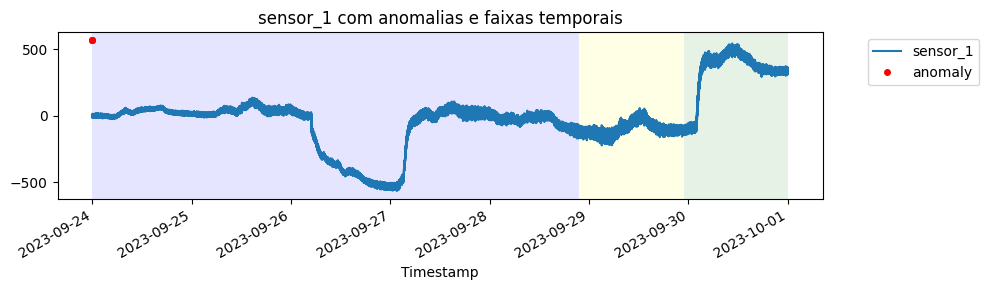

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


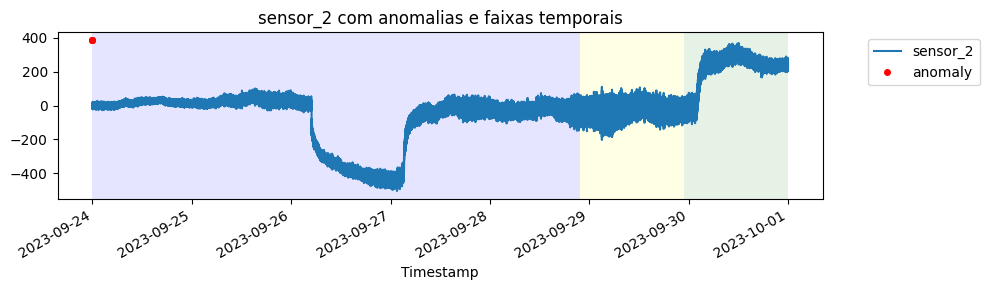

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


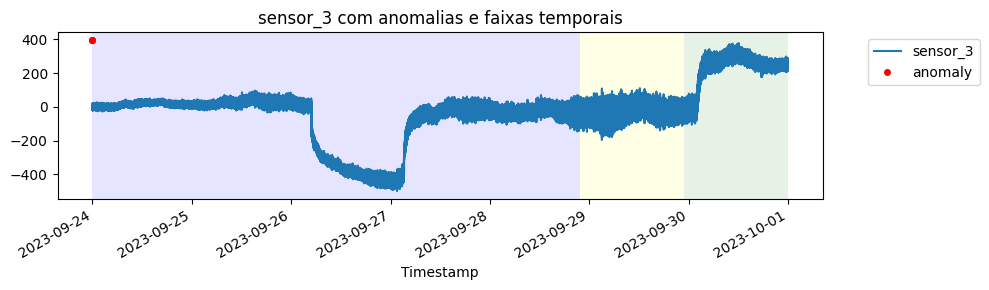

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


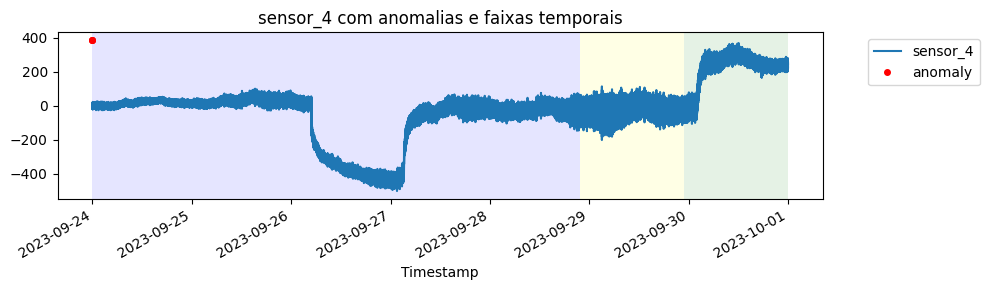

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


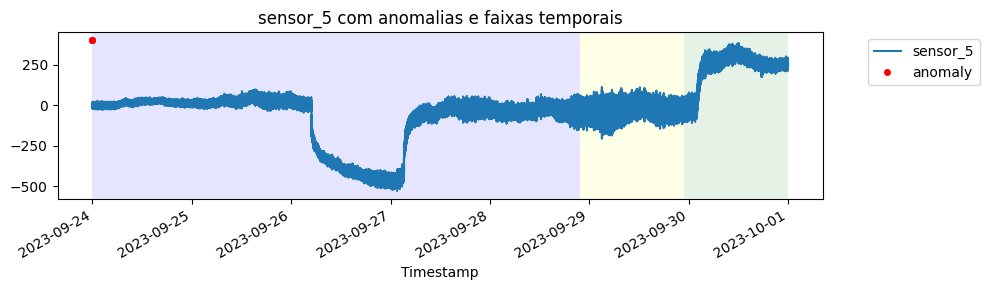

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


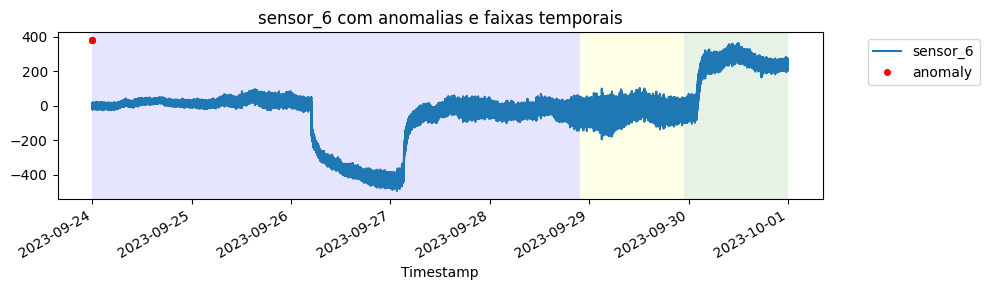

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


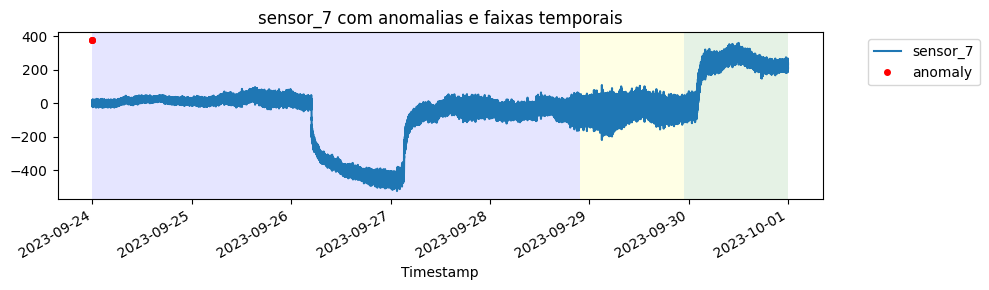

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


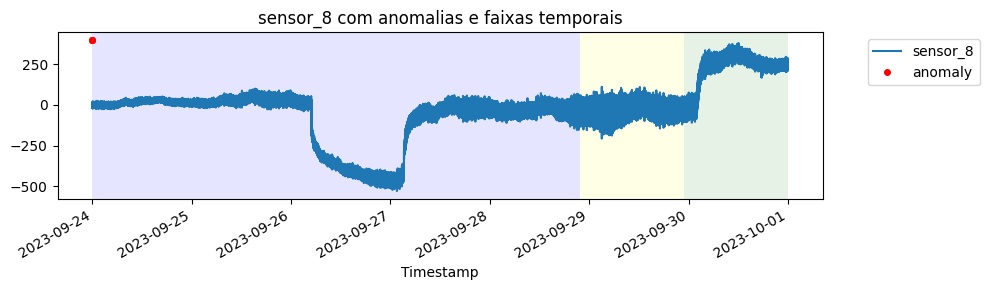

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


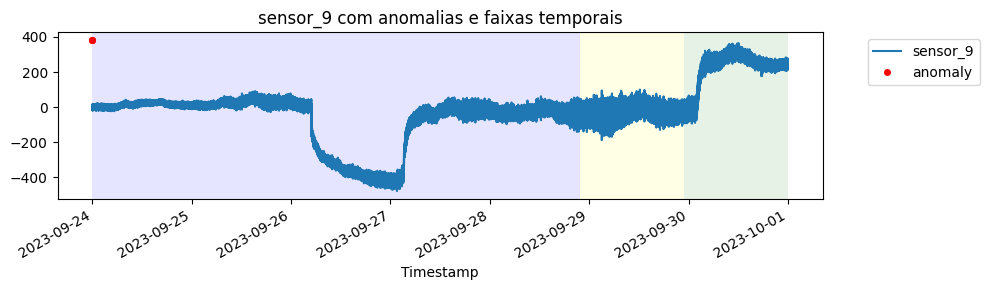

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


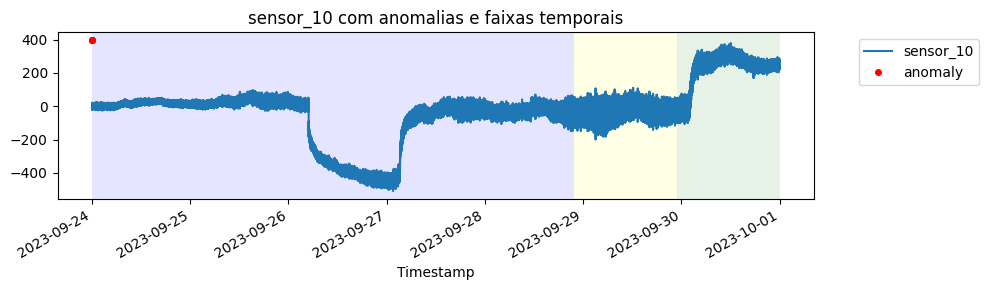

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


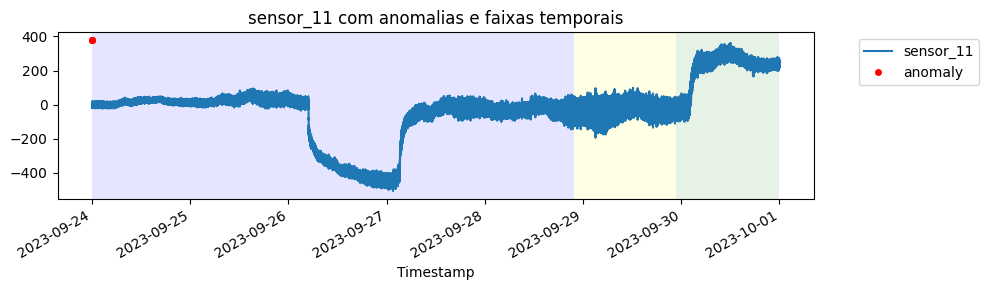

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


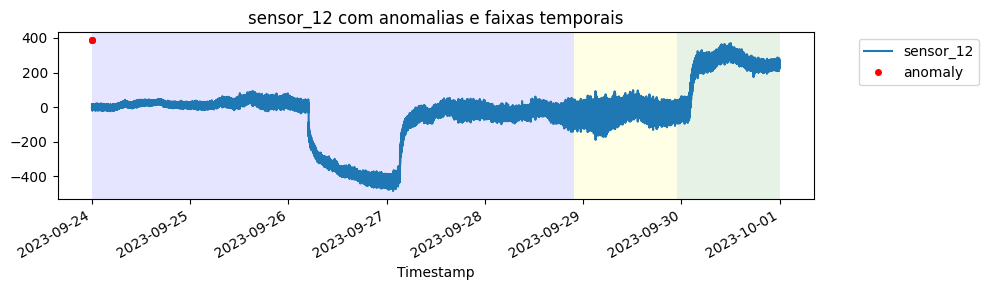

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


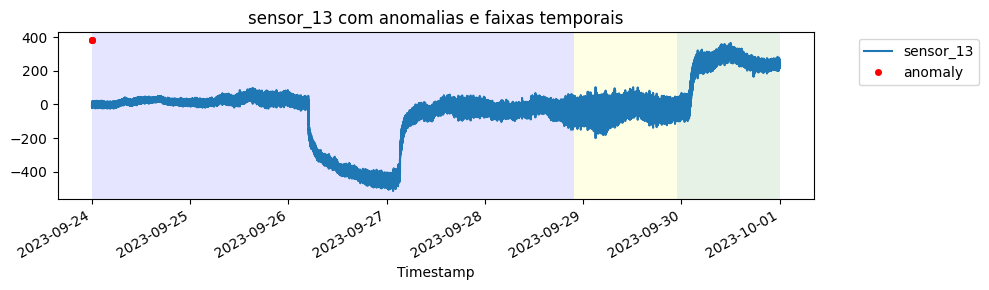

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


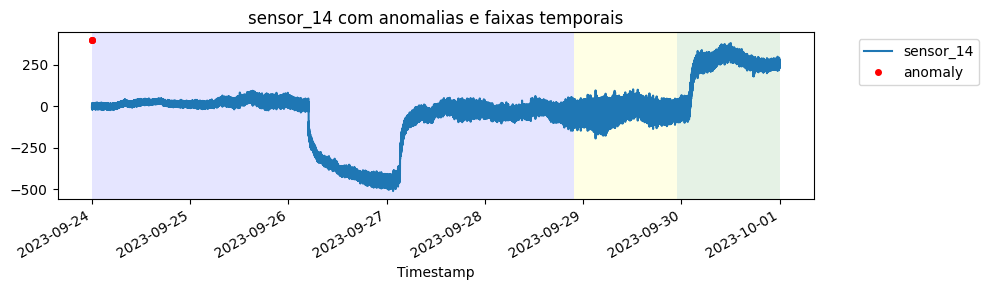

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


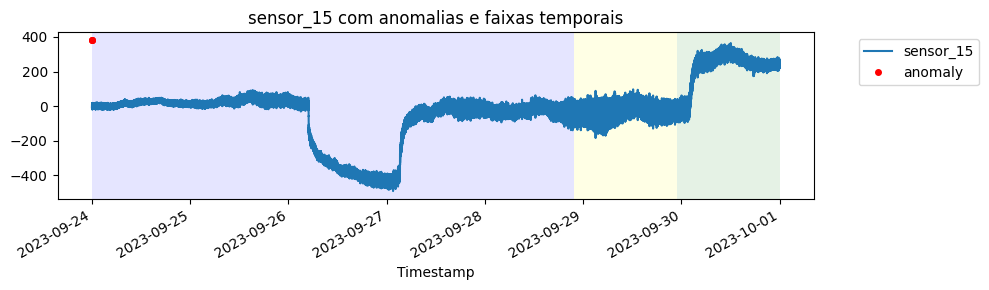

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


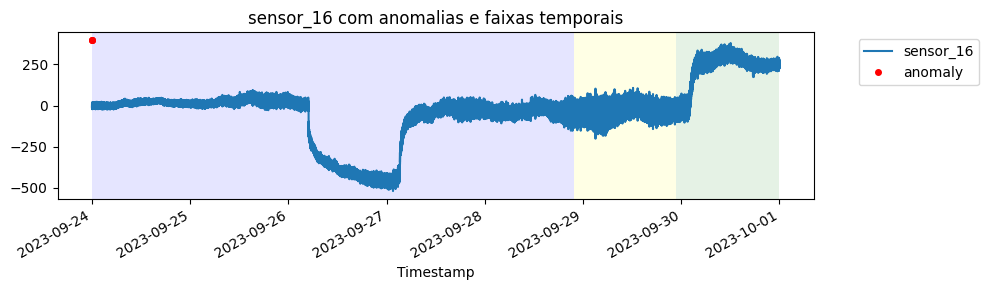

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


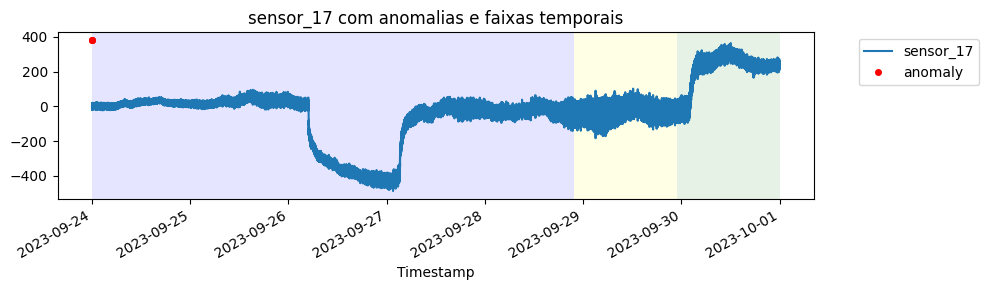

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


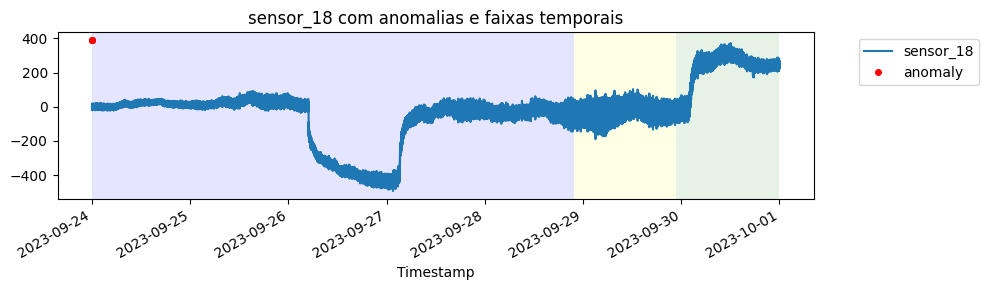

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


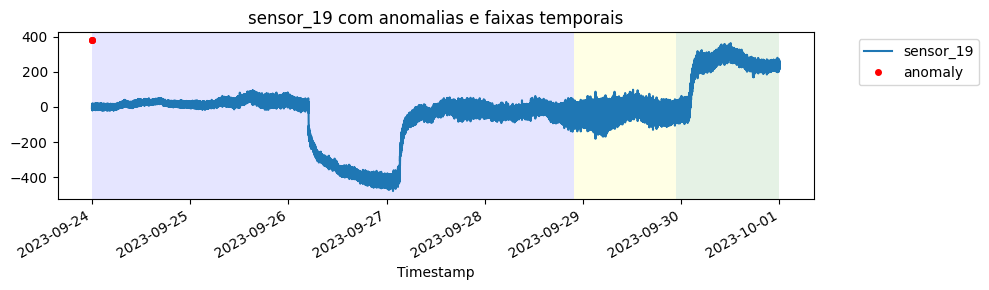

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


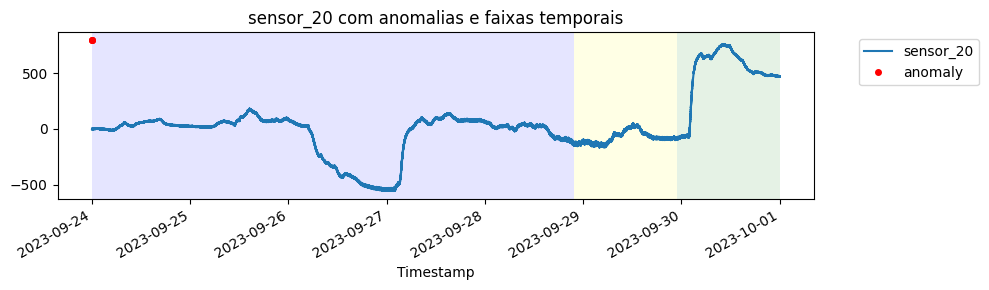

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


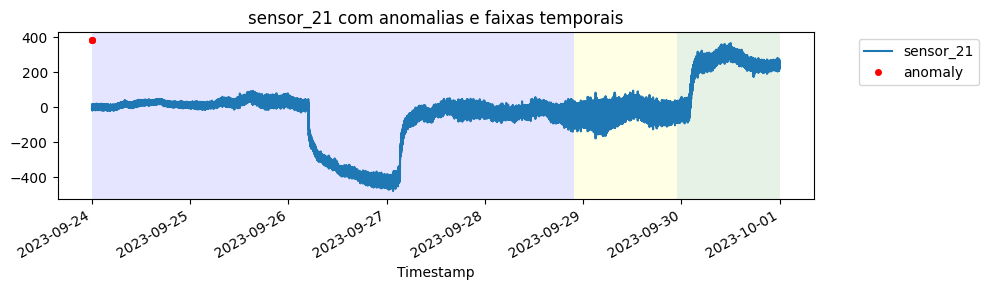

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


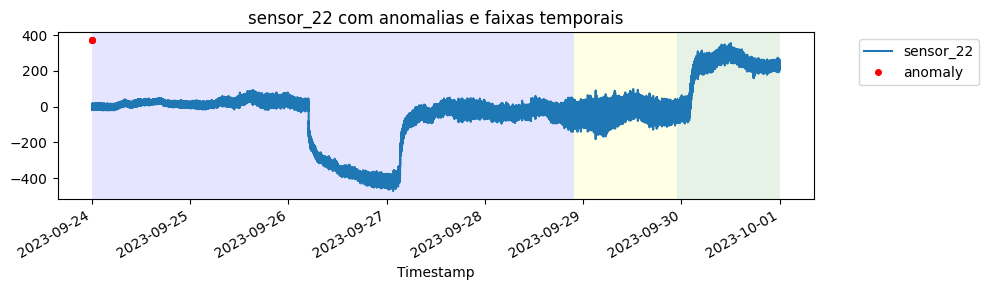

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


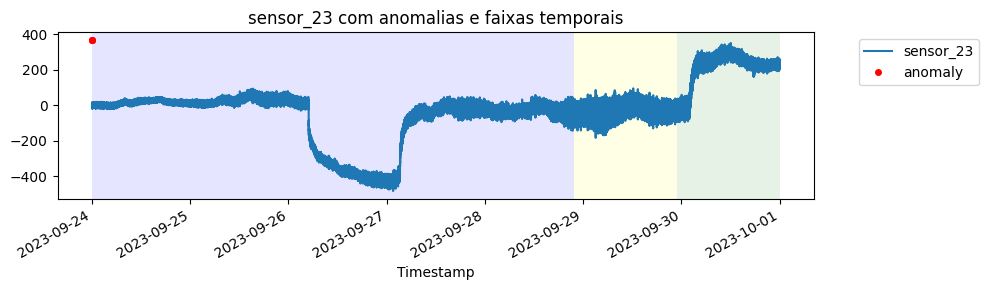

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


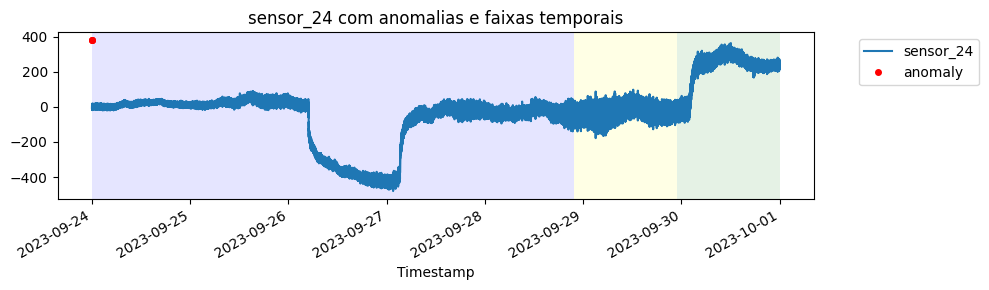

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


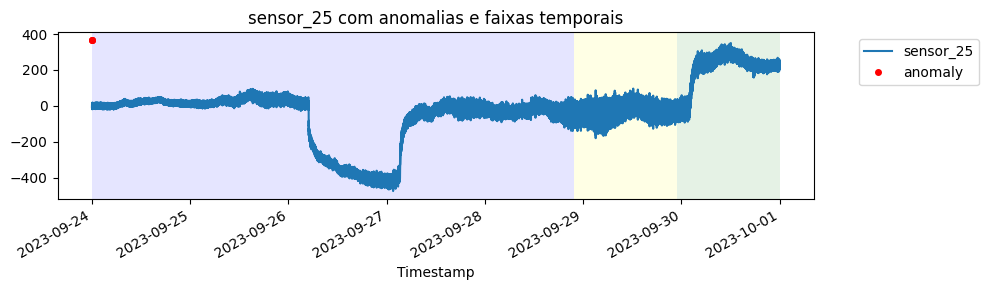

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


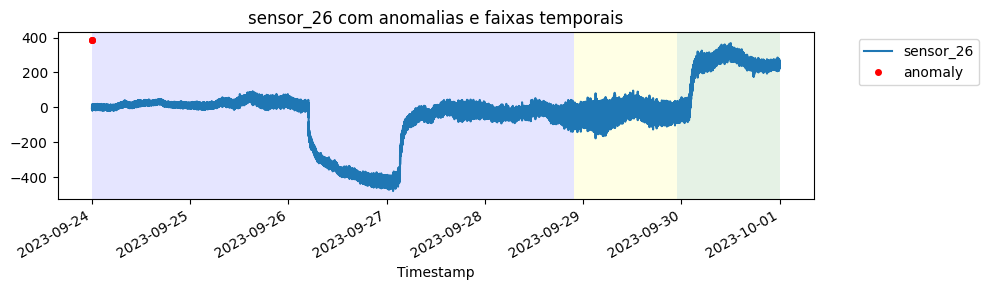

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


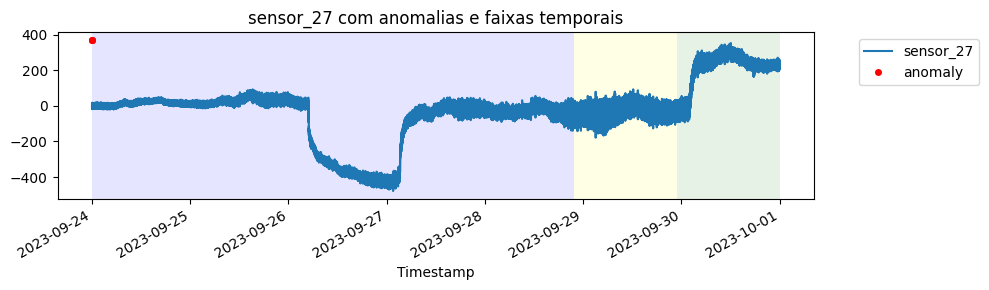

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


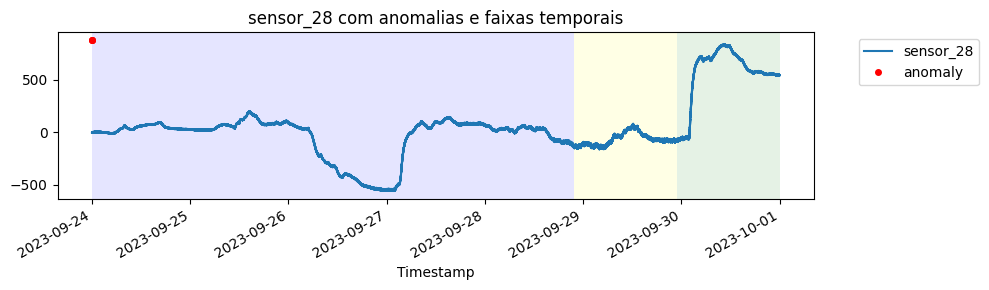

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


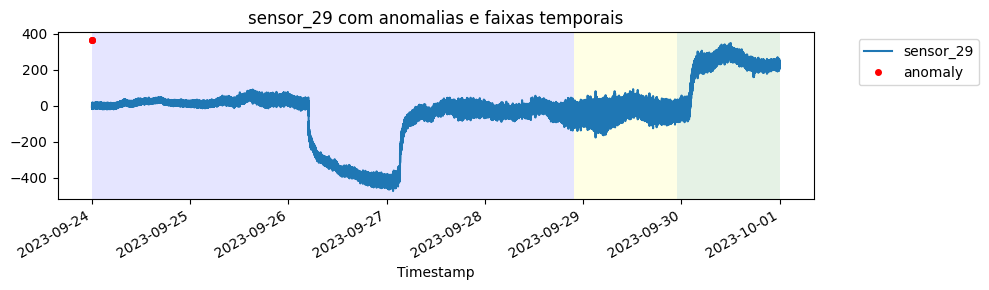

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


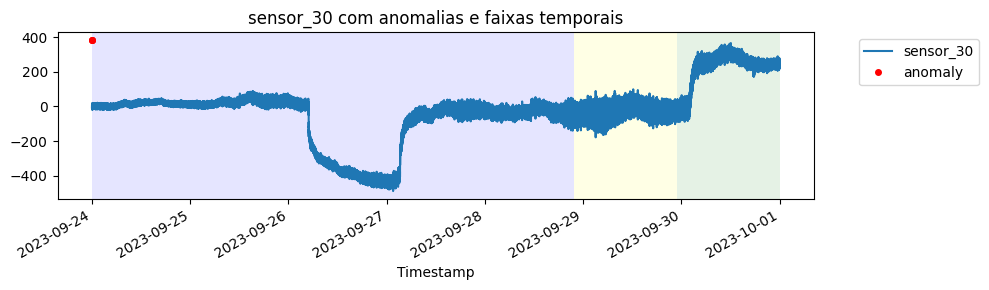

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


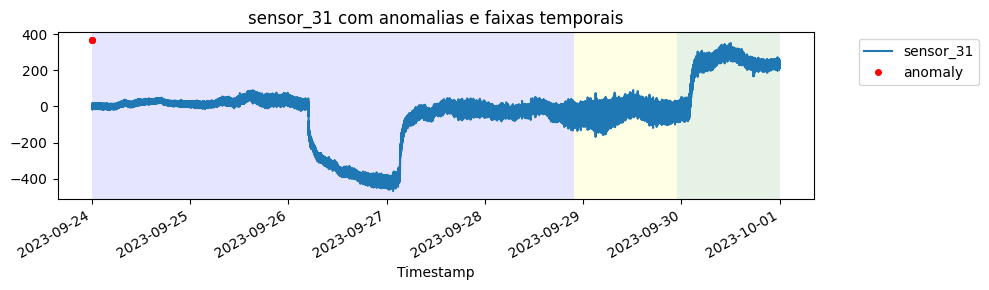

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


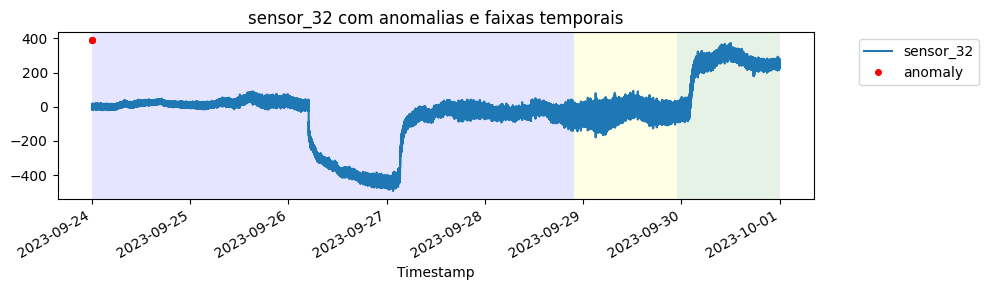

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


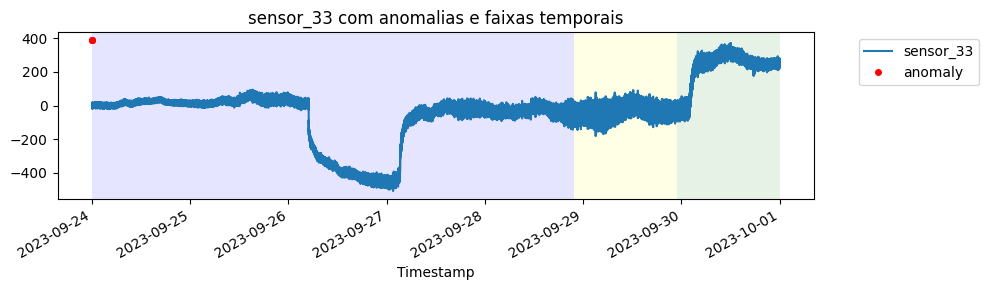

/tmp/ipython-input-2718382829.py:53: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


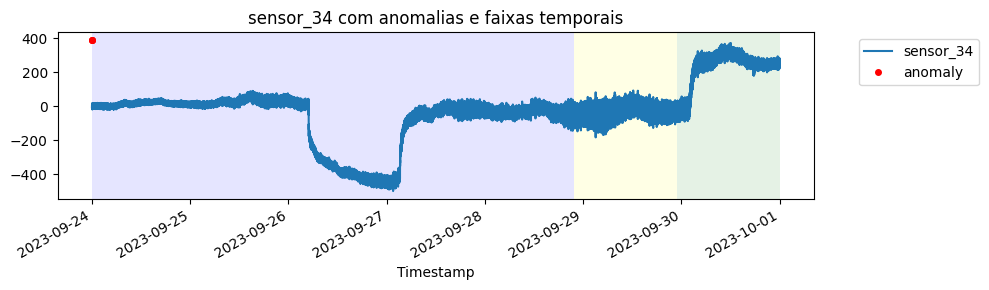

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Leitura dos arquivos CSV
df1 = pd.read_csv('/content/dataset_parte_1.csv')
df2 = pd.read_csv('/content/dataset_parte_2.csv')
df3 = pd.read_csv('/content/dataset_parte_3.csv')
df4 = pd.read_csv('/content/dataset_parte_4.csv')
df5 = pd.read_csv('/content/dataset_parte_5.csv')
df6 = pd.read_csv('/content/dataset_parte_6.csv')
df7 = pd.read_csv('/content/dataset_parte_7.csv')

# Concatenação dos dados
data = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)

# Conversão do timestamp e configuração do índice
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

# Criação da coluna label_binary
data['label_binary'] = data['label'].notna().astype(int)

# Remoção da coluna 'label'
data = data.drop('label', axis=1)

# Anomalias
anomaly_points = data[data['label_binary'] == 1]

# Timestamps para divisão do eixo X
timestamps = data.index
n = len(timestamps)
t1 = timestamps[int(n * 0.7)]
t2 = timestamps[int(n * 0.85)]
t3 = timestamps[-1]

# Loop pelos sensores
for i in range(1, 35):
    sensor_name = f'sensor_{i}'
    if sensor_name not in data.columns:
        continue  # pular se o sensor não existir

    fig, ax = plt.subplots(figsize=(10, 3))

    # Plot do sensor
    data[sensor_name].plot(ax=ax, label=sensor_name)

    # Valor máximo para deslocar os pontos vermelhos
    max_val = data[sensor_name].max()
    y_offset = max_val * 0.05
    y_pos = [max_val + y_offset] * len(anomaly_points)

    # Plot dos pontos vermelhos
    ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')

    # Faixas de fundo coloridas
    ax.axvspan(timestamps[0], t1, facecolor='blue', alpha=0.1)
    ax.axvspan(t1, t2, facecolor='yellow', alpha=0.1)
    ax.axvspan(t2, t3, facecolor='green', alpha=0.1)

    # Título e legenda
    ax.set_title(f'{sensor_name} com anomalias e faixas temporais')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


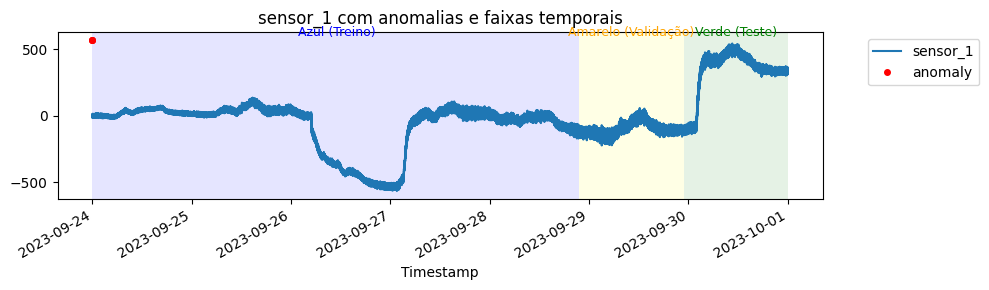

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


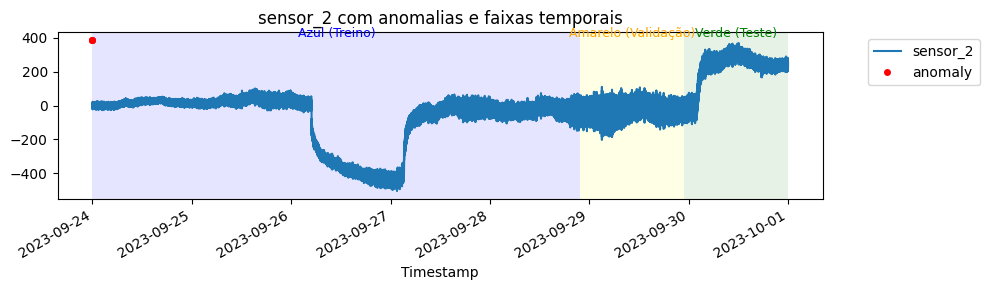

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


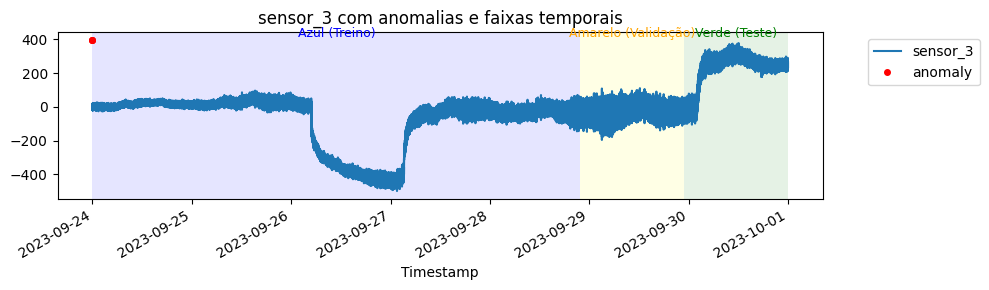

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


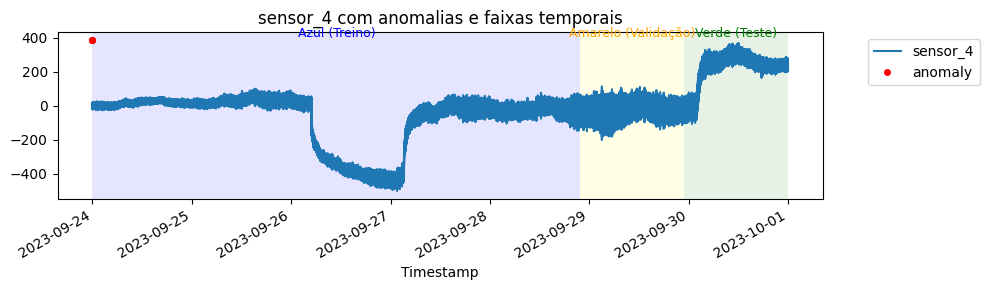

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


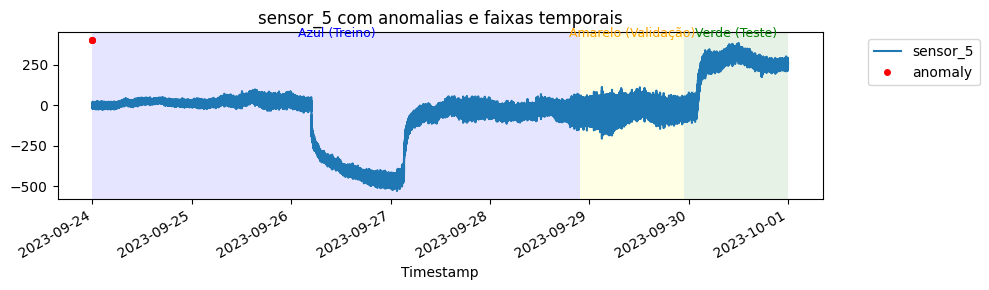

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


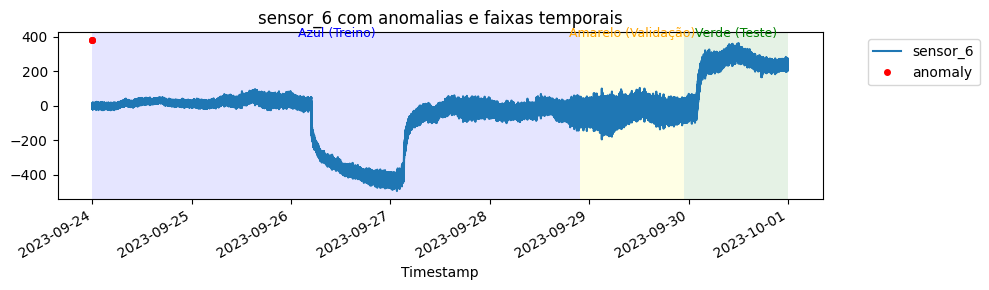

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


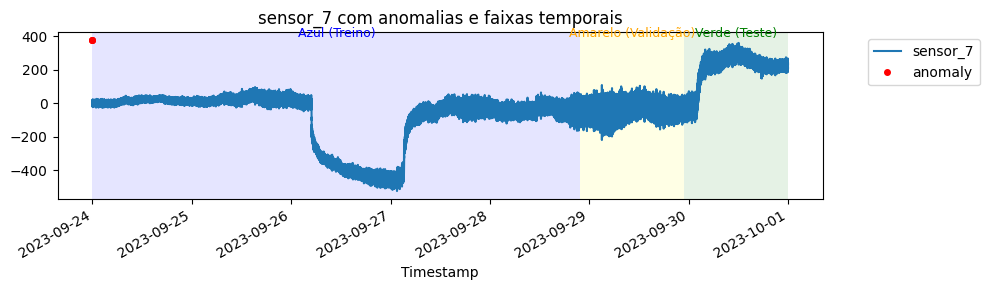

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


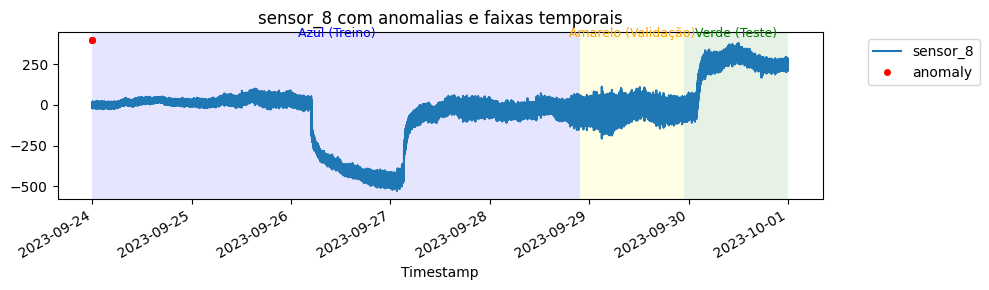

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


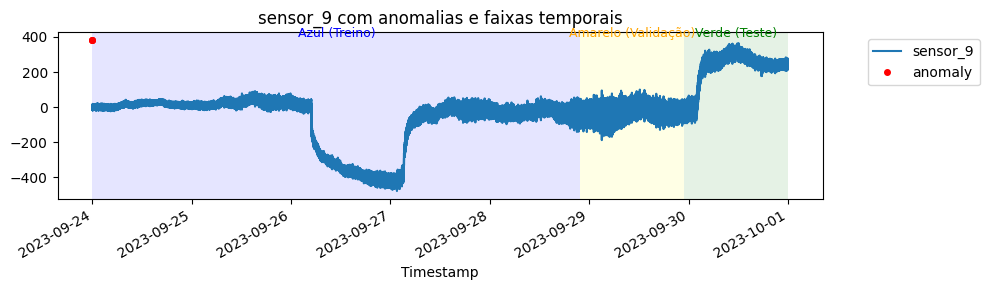

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


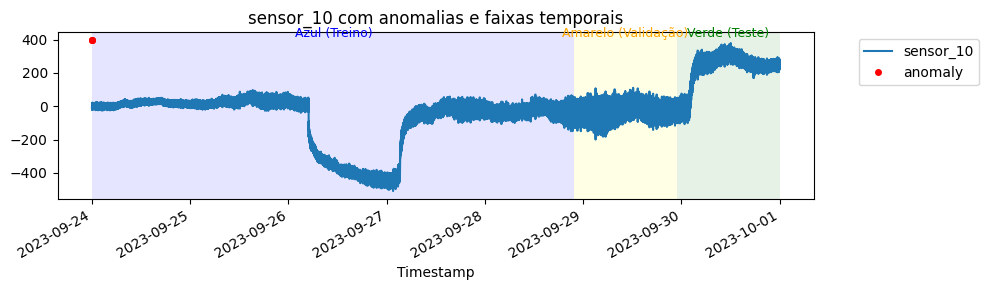

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


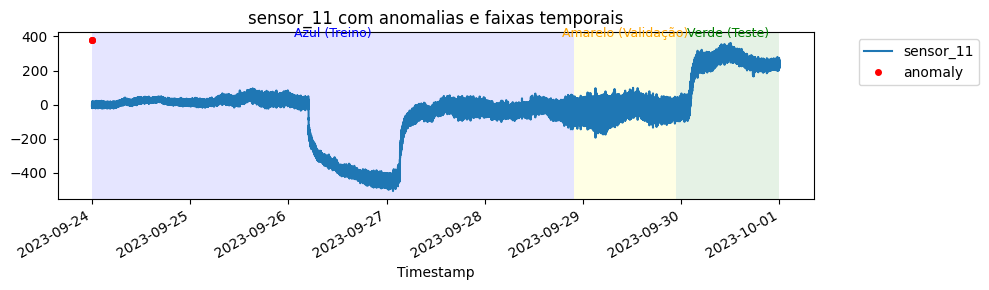

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


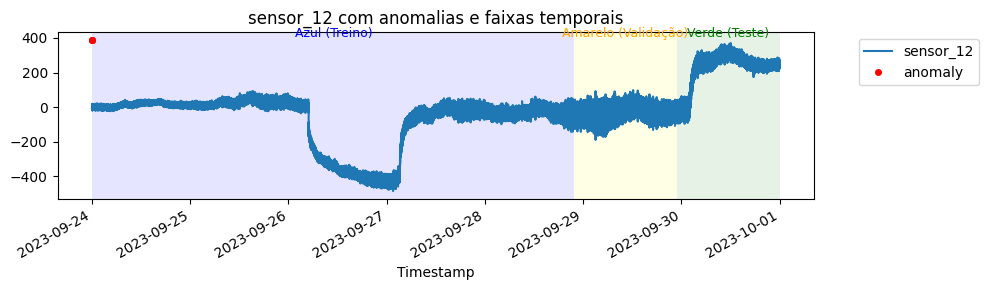

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


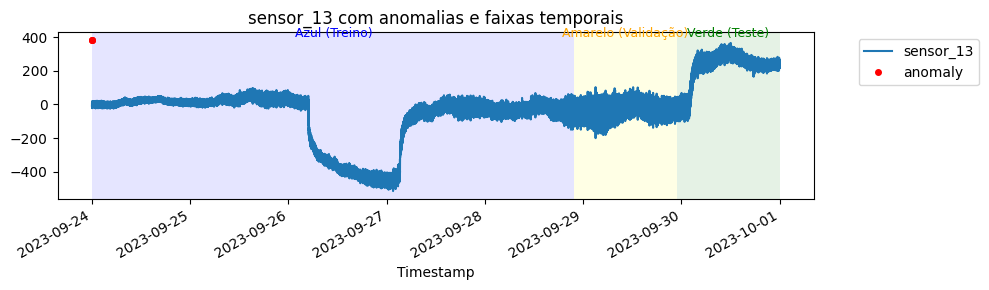

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


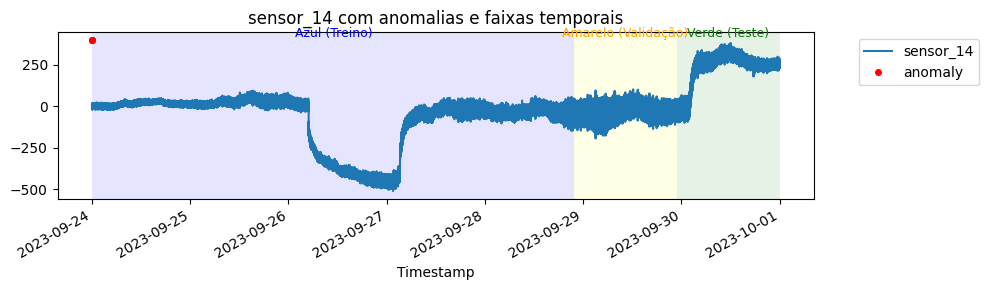

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


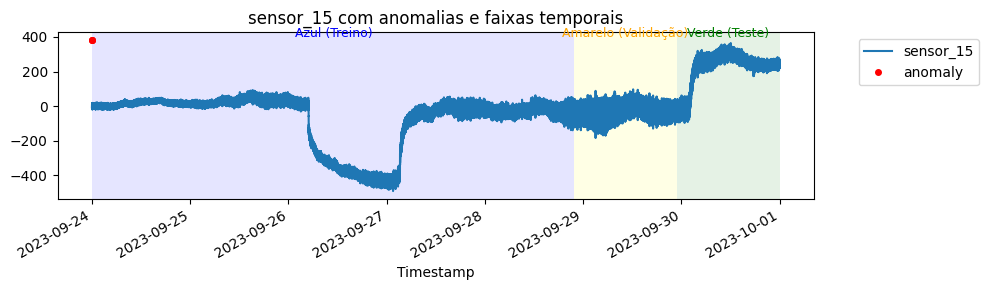

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


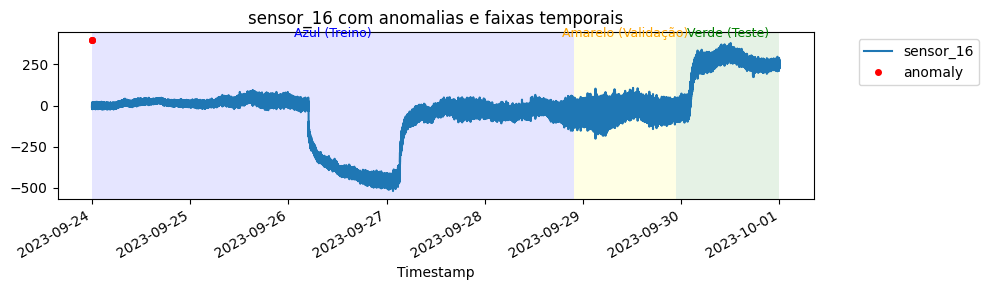

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


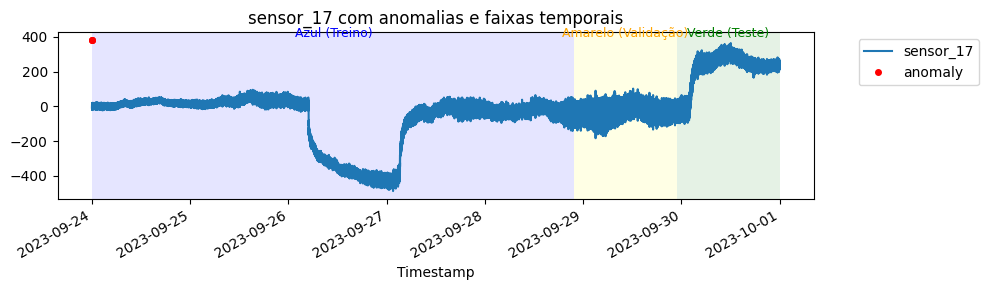

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


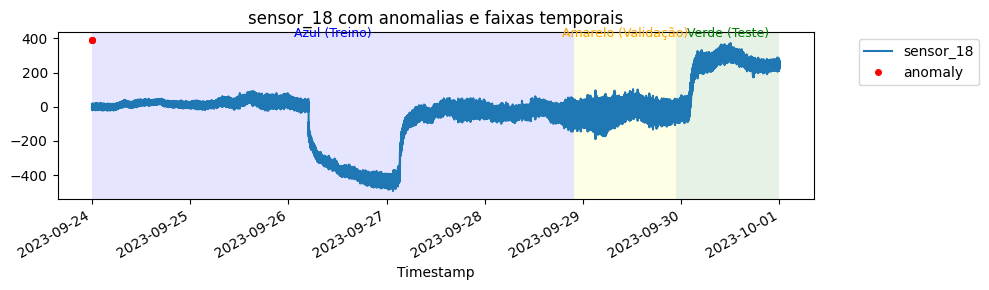

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


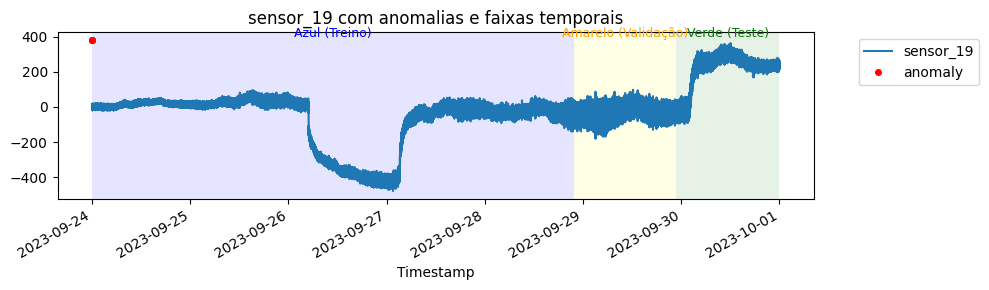

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


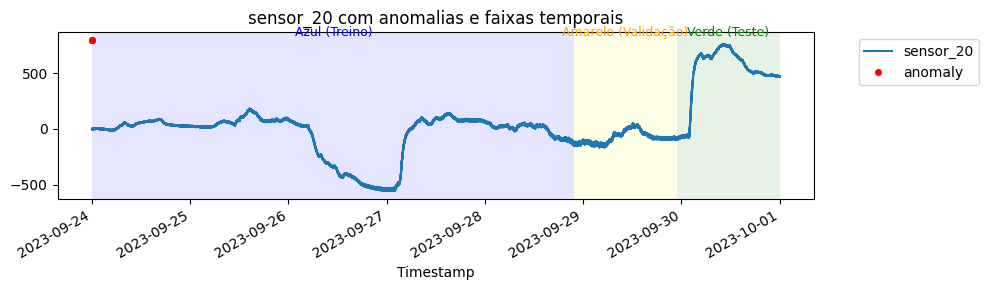

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


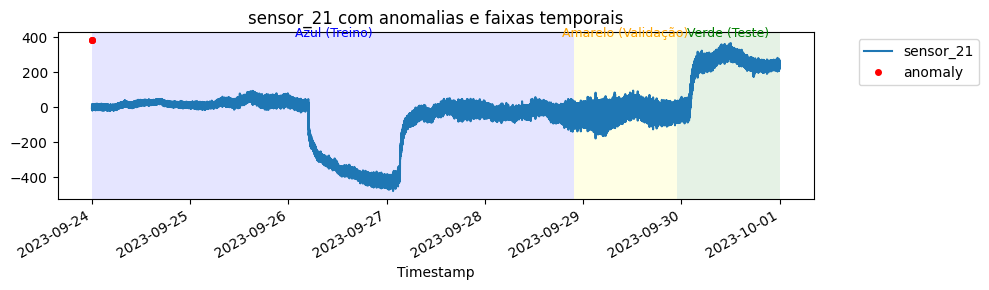

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


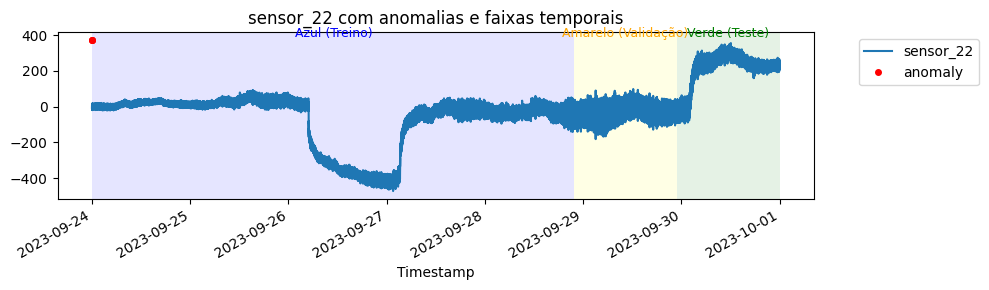

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


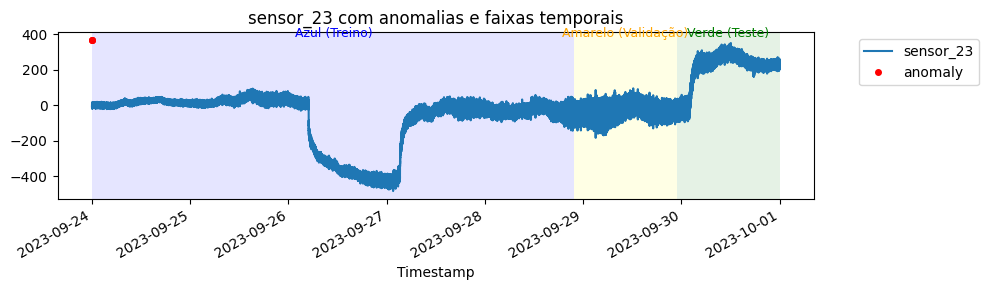

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


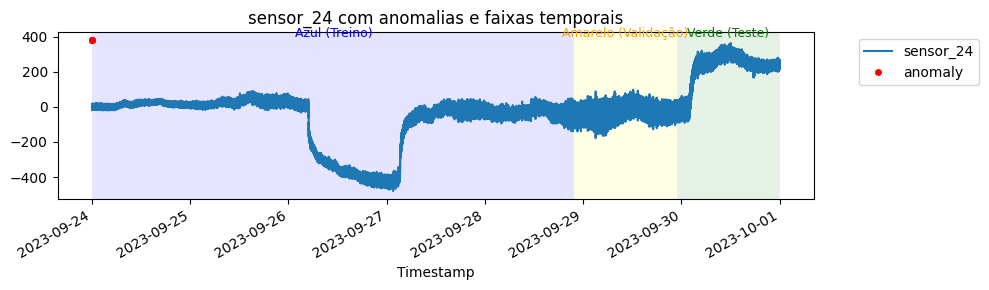

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


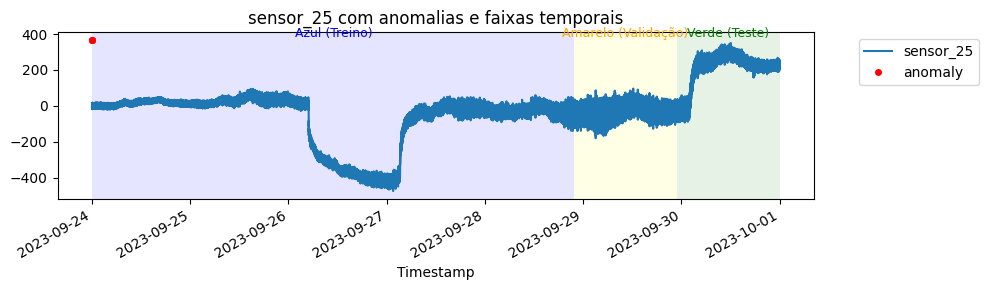

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


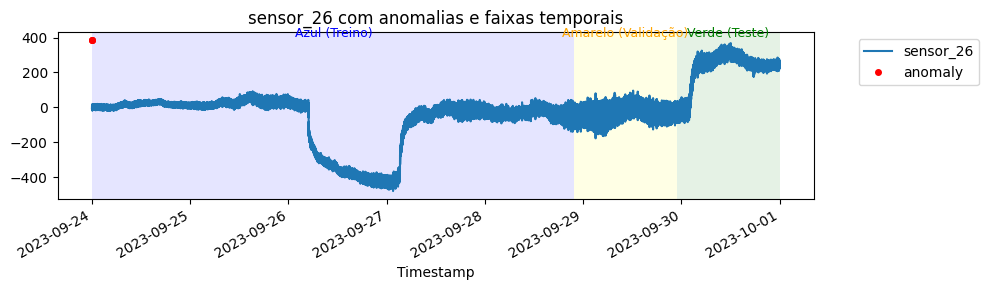

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


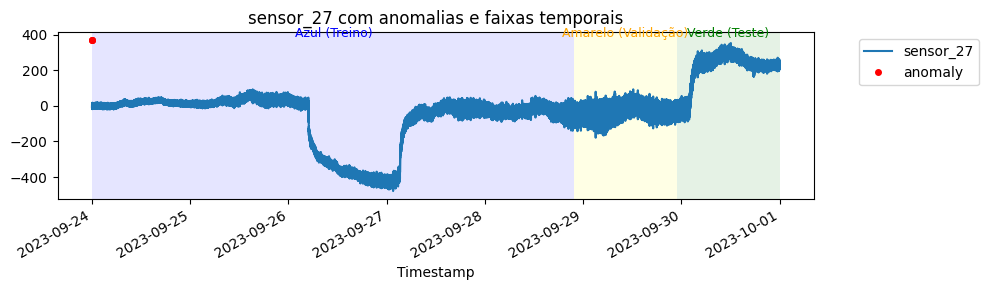

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


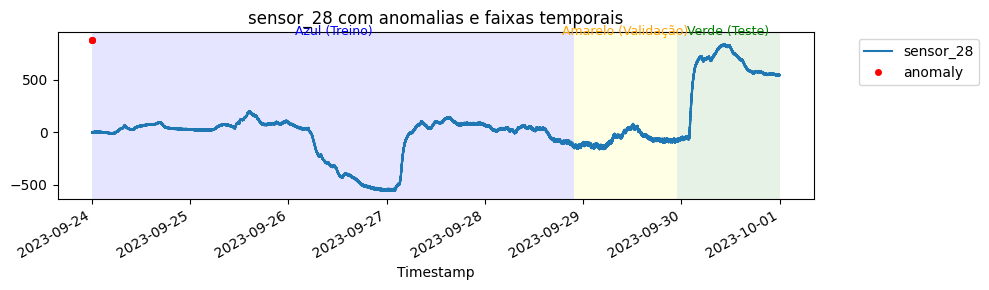

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


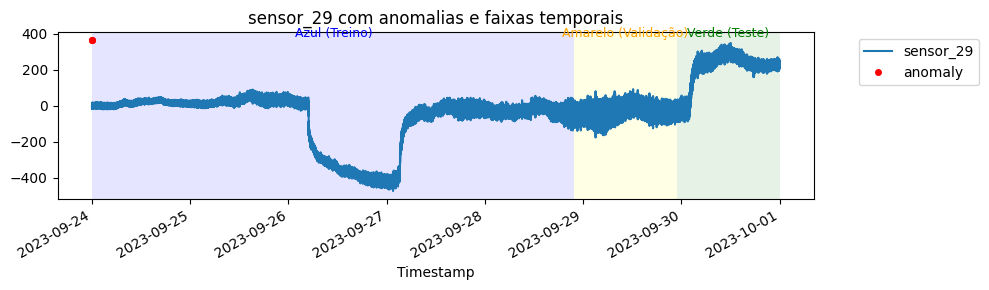

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


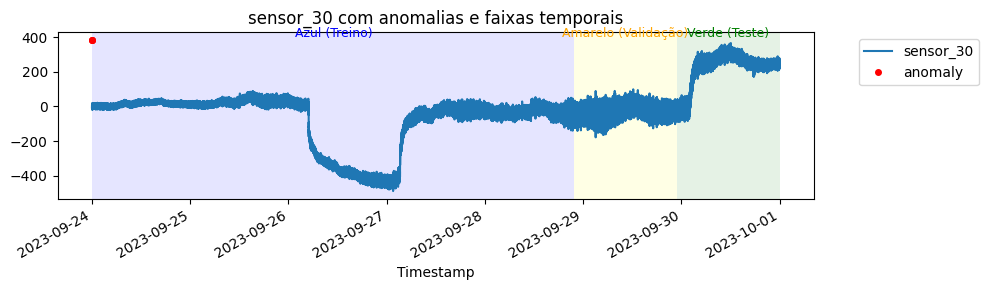

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


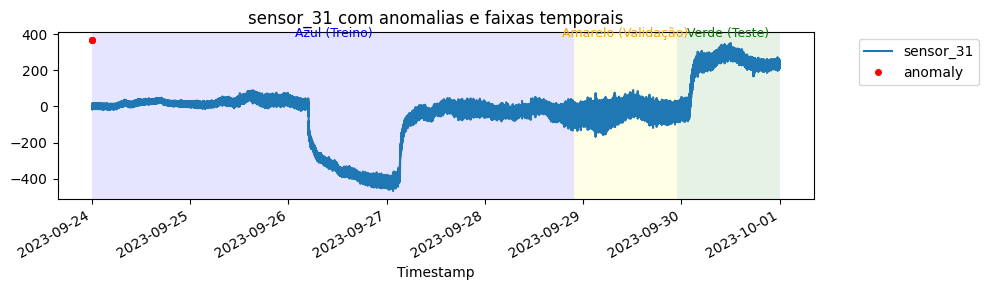

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


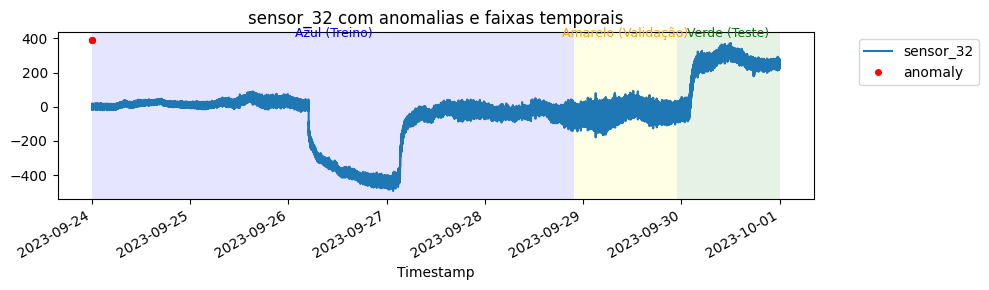

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


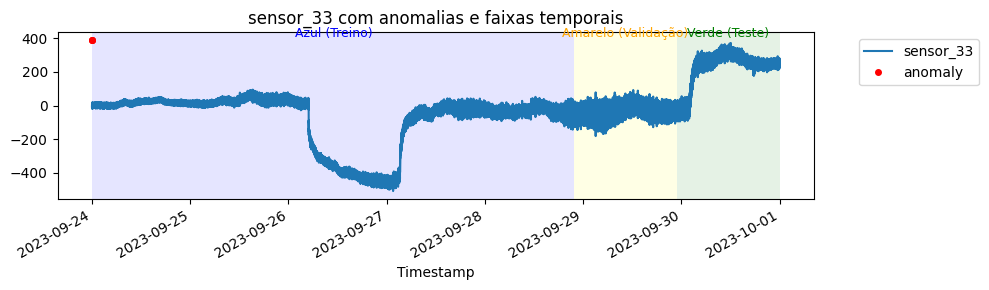

/tmp/ipython-input-4069066936.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')


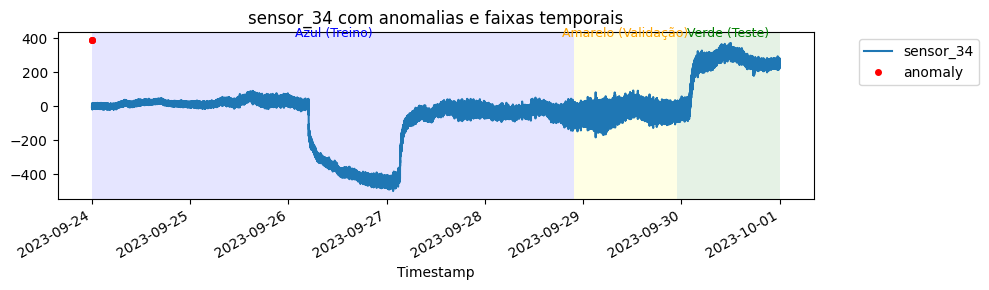

In [38]:
for i in range(1, 35):
    sensor_name = f'sensor_{i}'
    if sensor_name not in data.columns:
        continue  # pular se o sensor não existir

    fig, ax = plt.subplots(figsize=(10, 3))

    # Plot do sensor
    data[sensor_name].plot(ax=ax, label=sensor_name)

    # Valor máximo para deslocar os pontos vermelhos
    max_val = data[sensor_name].max()
    y_offset = max_val * 0.05
    y_pos = [max_val + y_offset] * len(anomaly_points)

    # Plot dos pontos vermelhos
    ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')

    # Faixas coloridas
    ax.axvspan(timestamps[0], t1, facecolor='blue', alpha=0.1)
    ax.axvspan(t1, t2, facecolor='yellow', alpha=0.1)
    ax.axvspan(t2, t3, facecolor='green', alpha=0.1)

    # Adiciona texto nas faixas coloridas
    mid_t0_t1 = timestamps[int(n * 0.35)]
    mid_t1_t2 = timestamps[int(n * 0.775)]
    mid_t2_t3 = timestamps[int(n * 0.925)]

    ax.text(mid_t0_t1, max_val * 1.1, 'Azul (Treino)', color='blue', fontsize=9, ha='center')
    ax.text(mid_t1_t2, max_val * 1.1, 'Amarelo (Validação)', color='orange', fontsize=9, ha='center')
    ax.text(mid_t2_t3, max_val * 1.1, 'Verde (Teste)', color='green', fontsize=9, ha='center')

    # Título e legenda
    ax.set_title(f'{sensor_name} com anomalias e faixas temporais')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

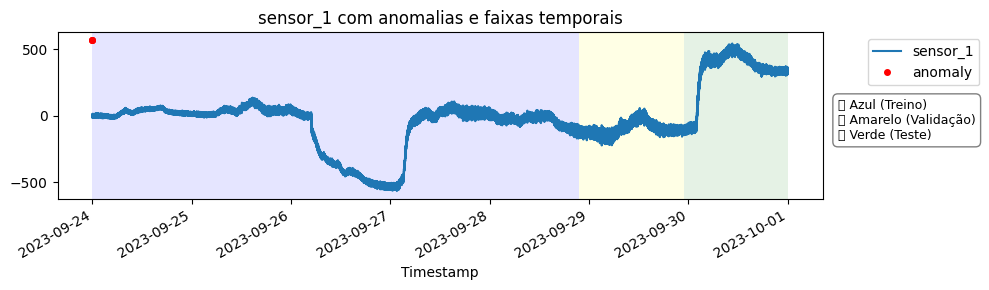

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

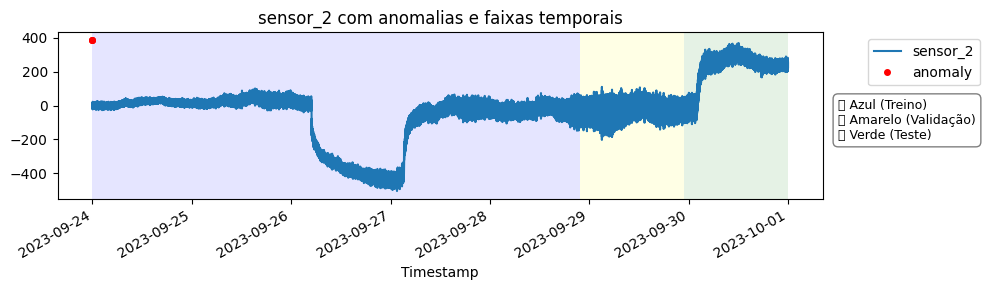

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

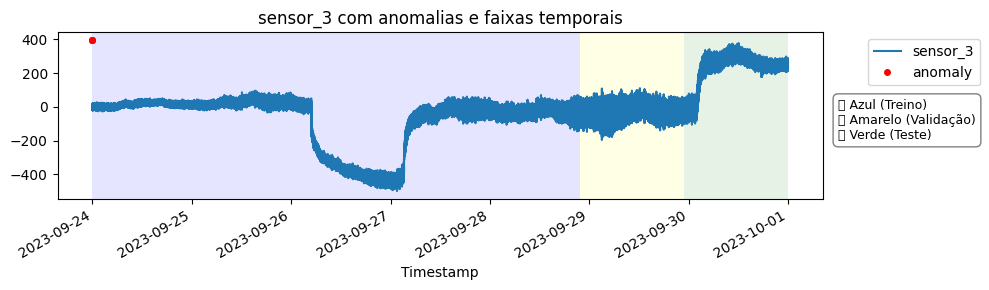

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

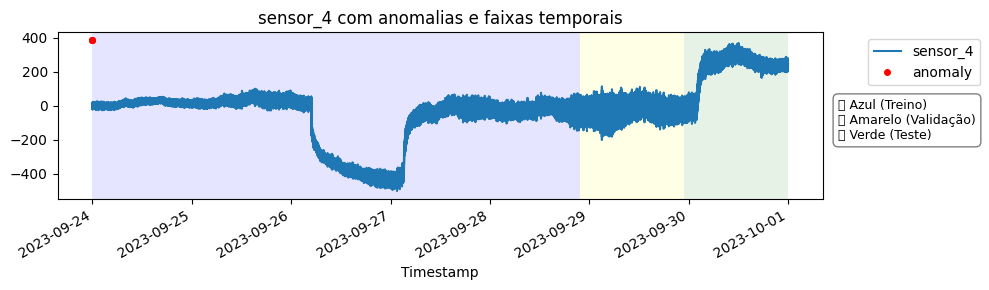

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

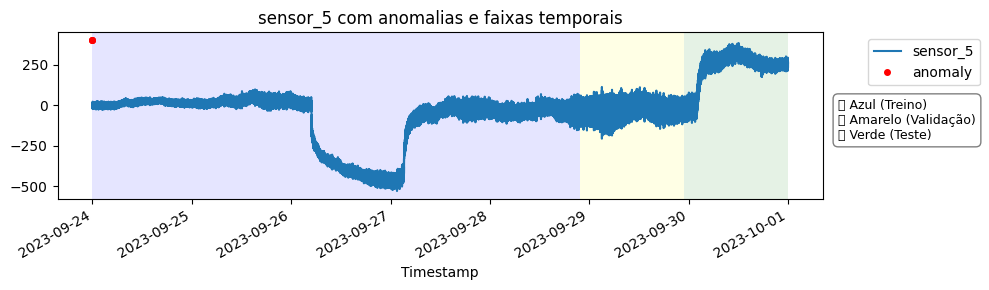

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

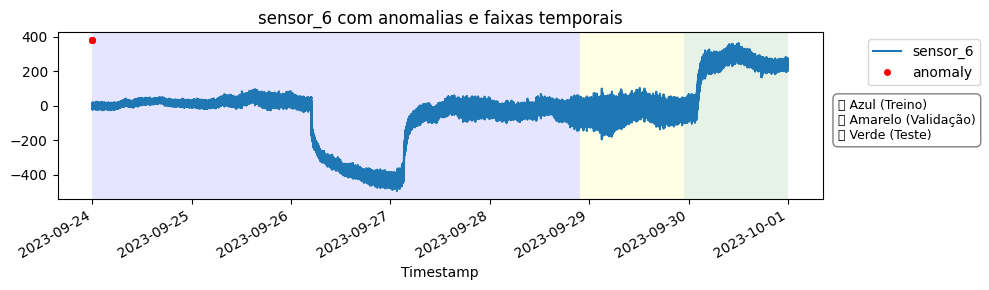

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

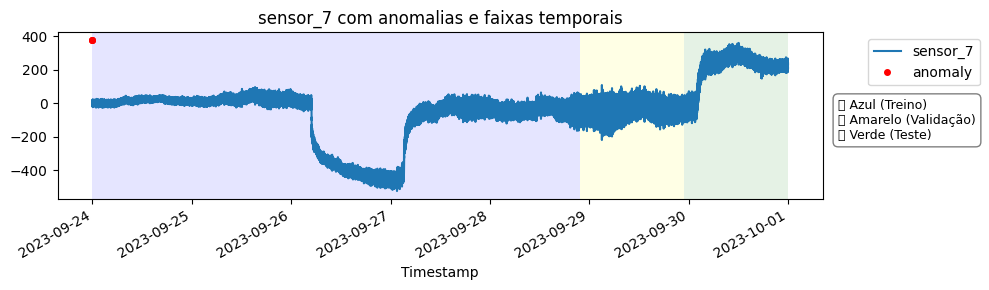

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

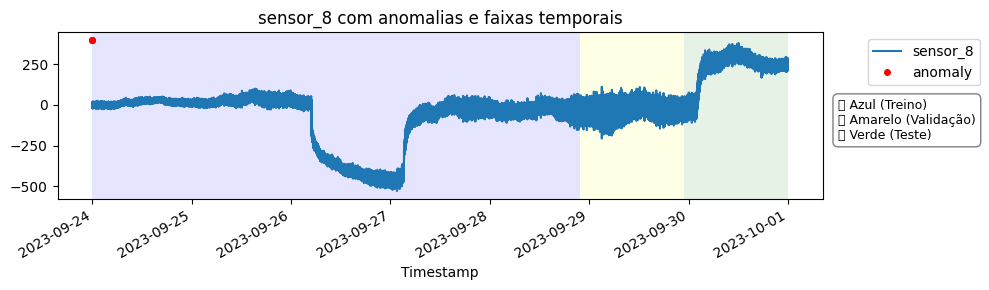

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

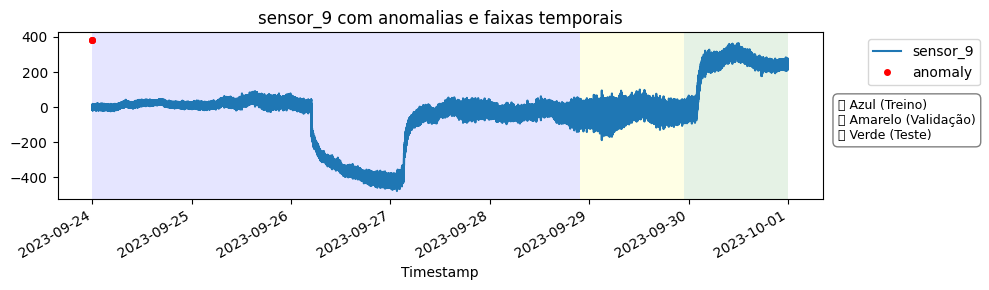

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

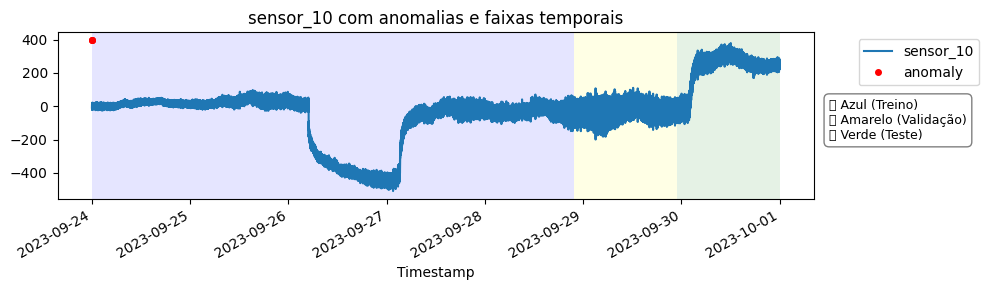

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

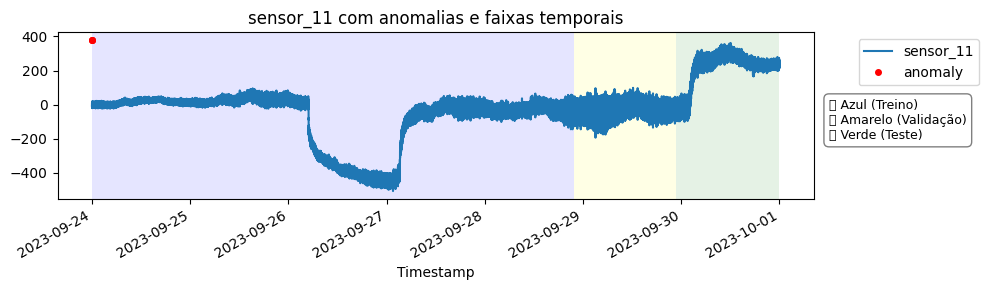

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

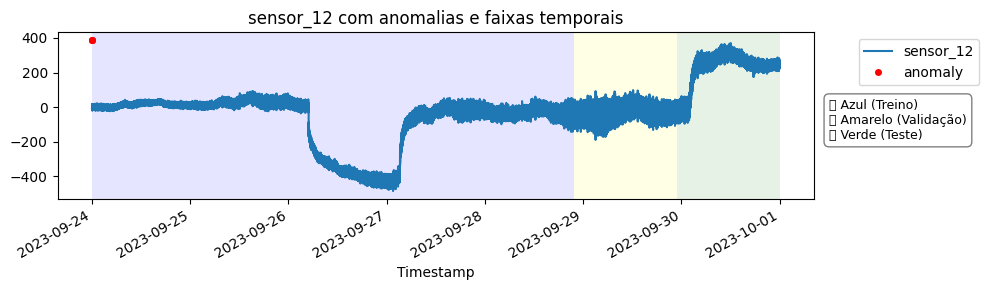

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

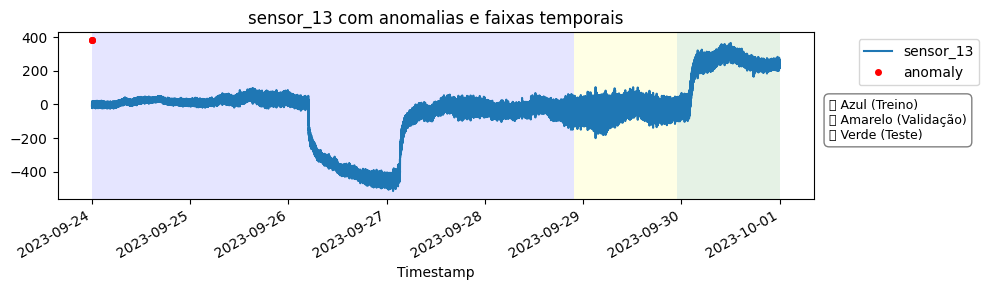

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

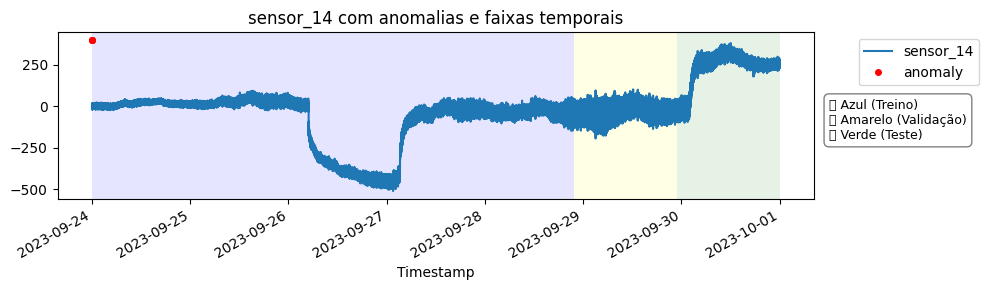

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

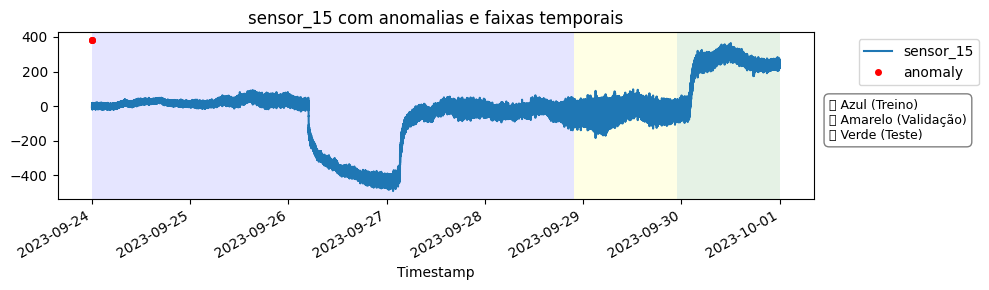

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

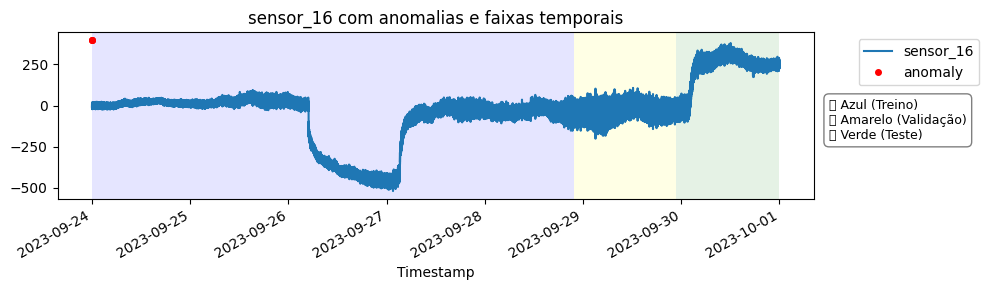

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

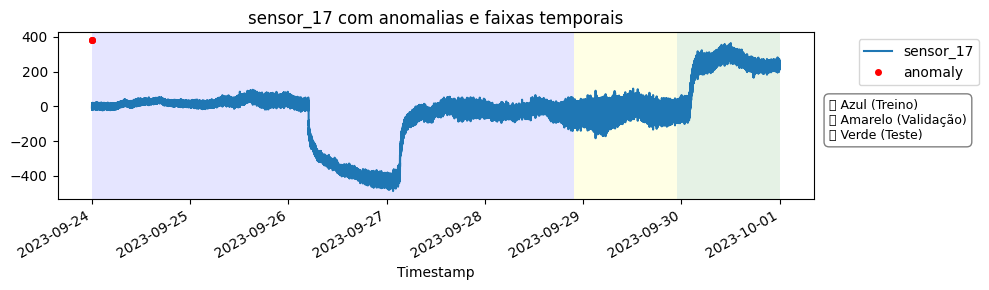

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

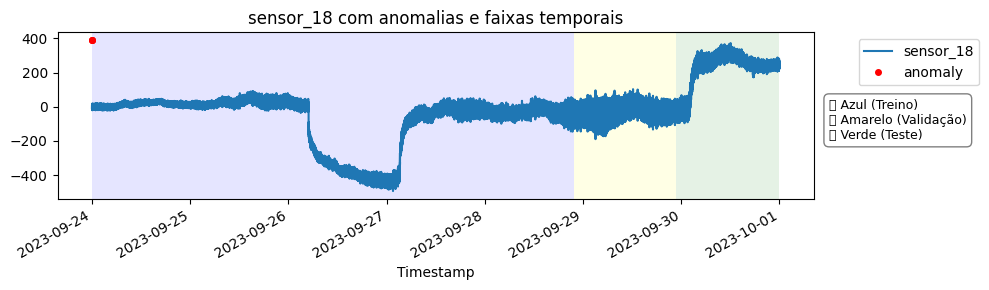

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

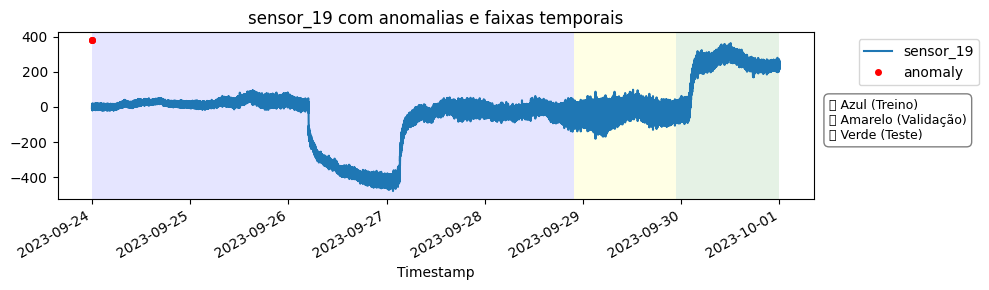

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

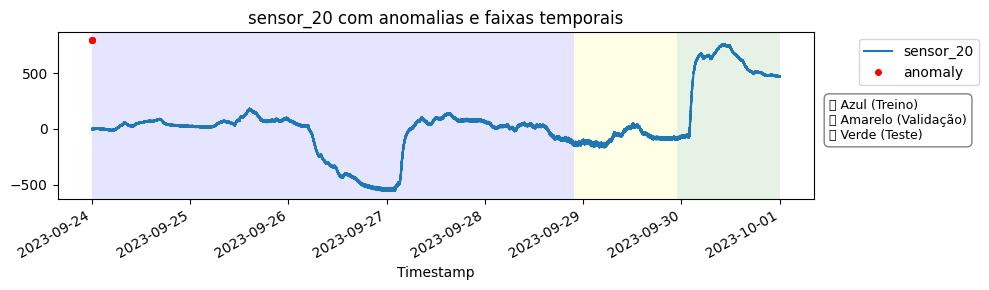

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

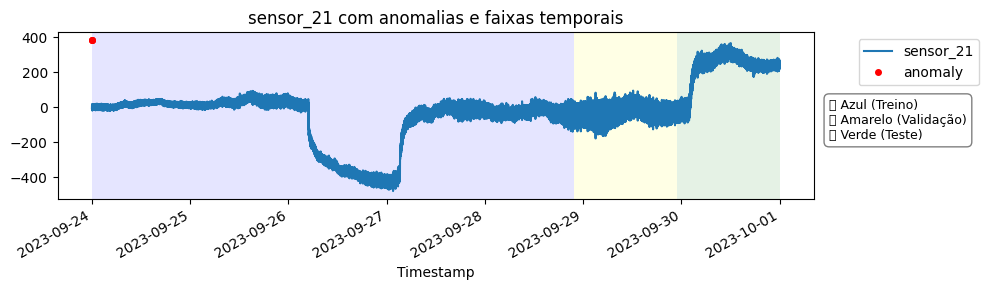

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

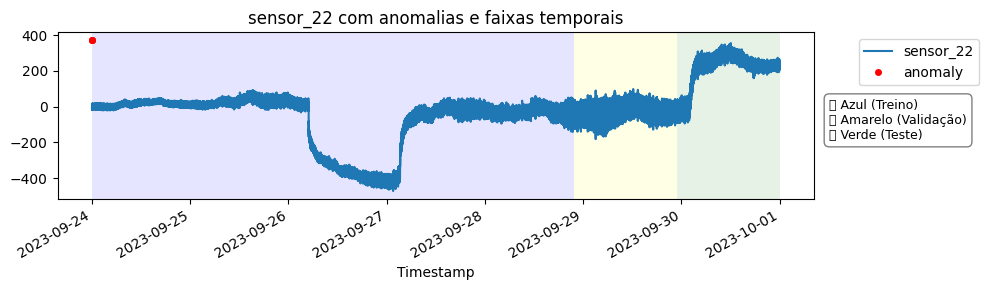

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

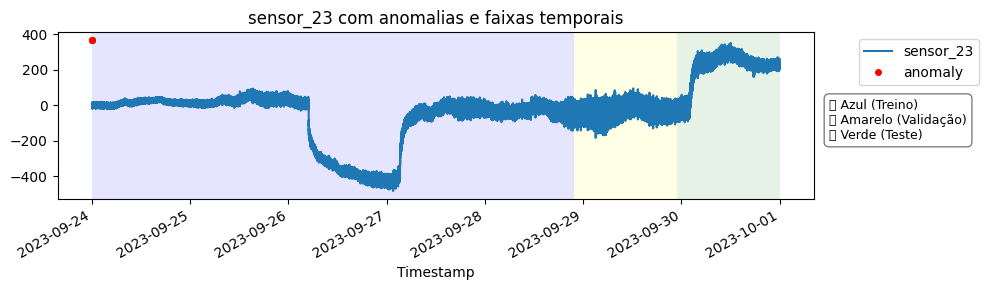

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

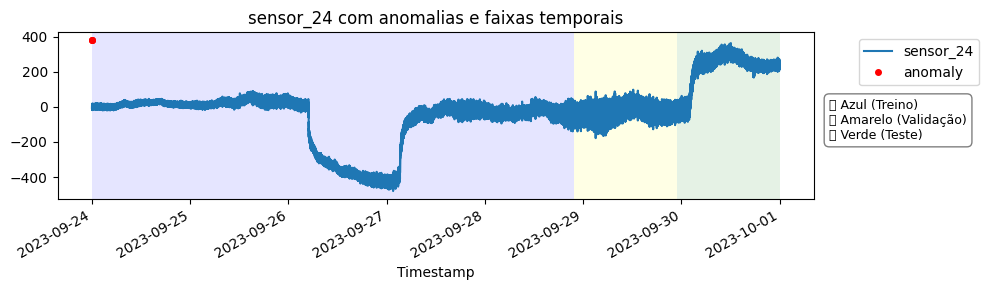

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

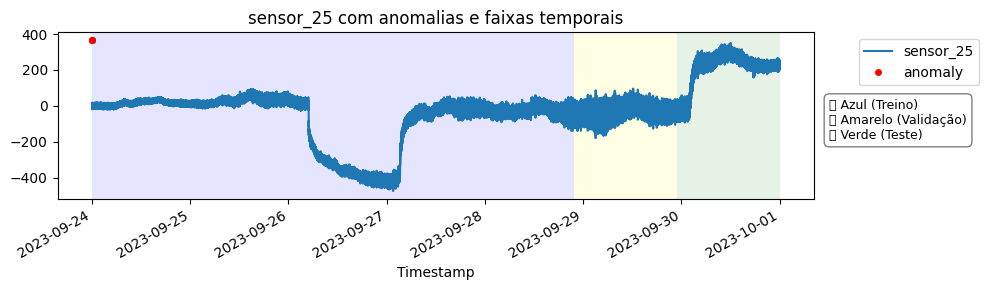

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

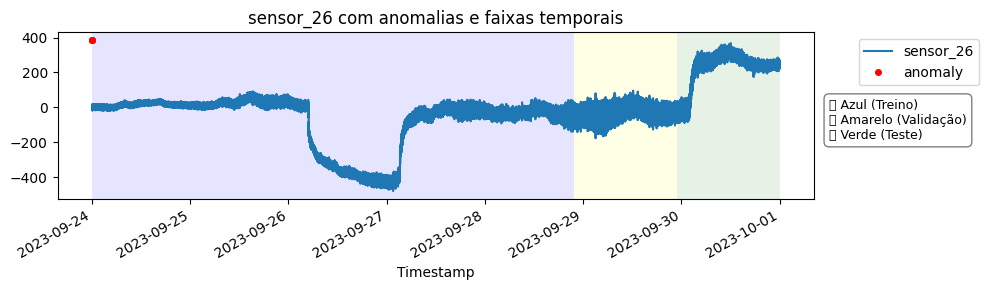

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

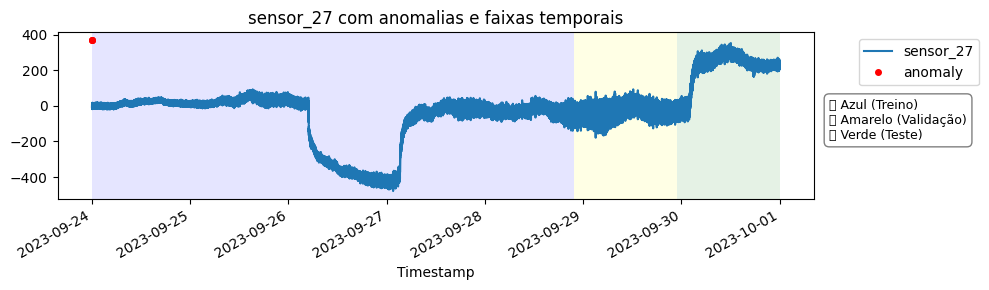

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

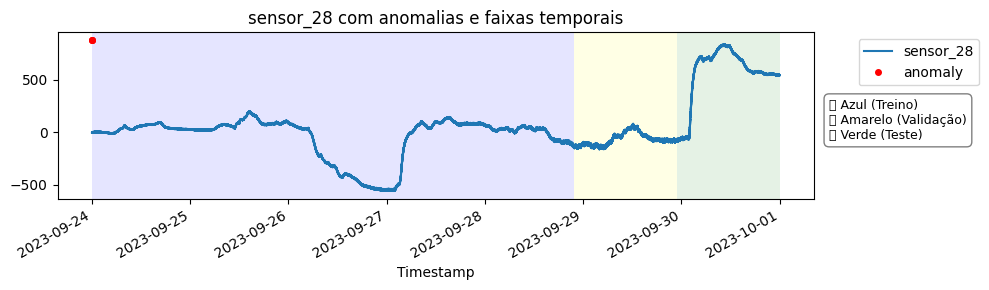

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

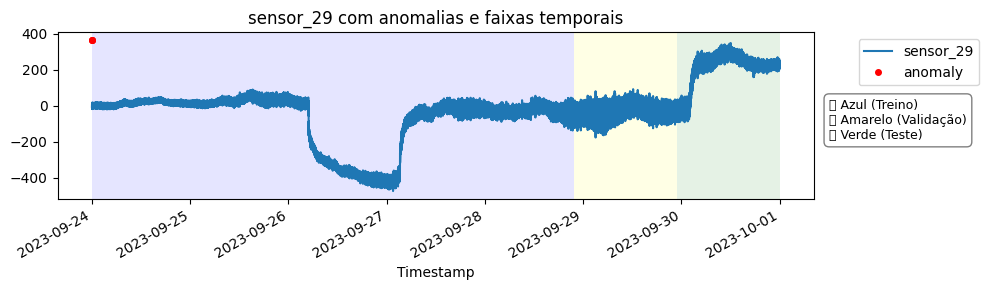

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

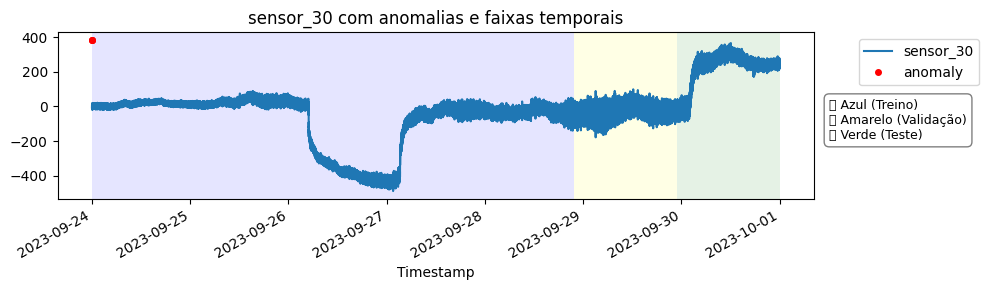

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

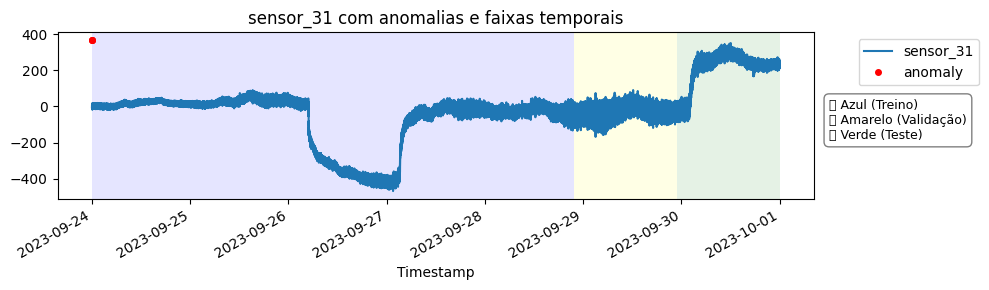

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

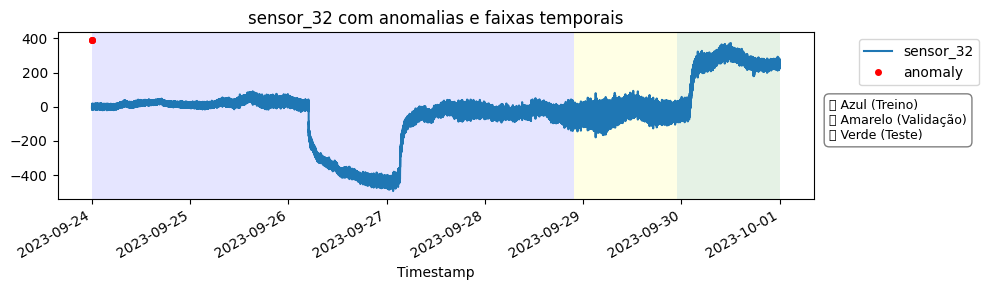

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

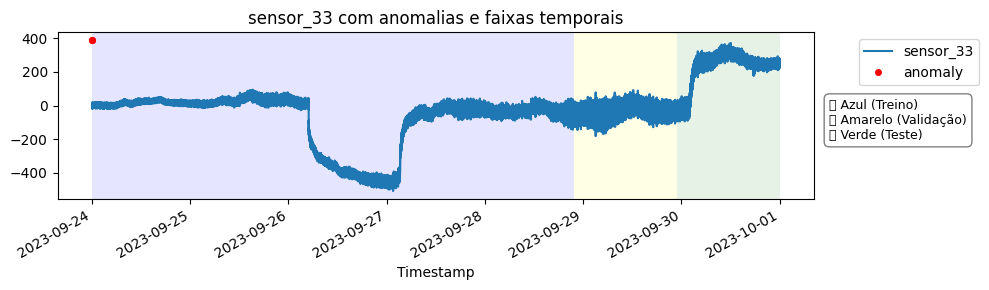

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

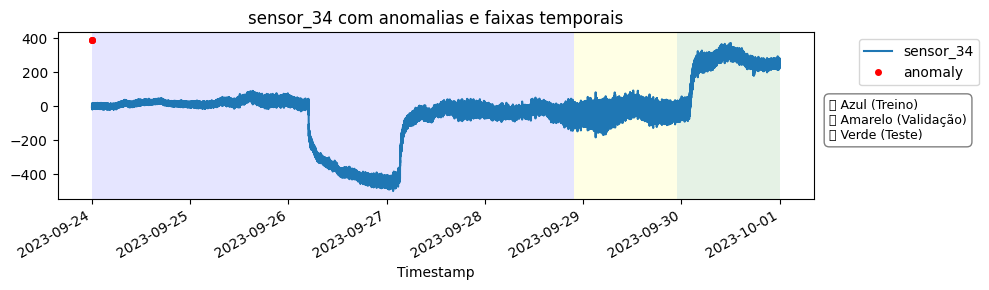

In [39]:
for i in range(1, 35):
    sensor_name = f'sensor_{i}'
    if sensor_name not in data.columns:
        continue  # pular se o sensor não existir

    fig, ax = plt.subplots(figsize=(10, 3))

    # Plot do sensor
    data[sensor_name].plot(ax=ax, label=sensor_name)

    # Valor máximo para deslocar os pontos vermelhos
    max_val = data[sensor_name].max()
    y_offset = max_val * 0.05
    y_pos = [max_val + y_offset] * len(anomaly_points)

    # Plot dos pontos vermelhos
    ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')

    # Faixas coloridas
    ax.axvspan(timestamps[0], t1, facecolor='blue', alpha=0.1)
    ax.axvspan(t1, t2, facecolor='yellow', alpha=0.1)
    ax.axvspan(t2, t3, facecolor='green', alpha=0.1)

    # Título e legenda
    ax.set_title(f'{sensor_name} com anomalias e faixas temporais')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Caixa de texto explicativa no canto direito
    ax.text(1.02, 0.6,
            '🟦 Azul (Treino)\n🟨 Amarelo (Validação)\n🟩 Verde (Teste)',
            transform=ax.transAxes,
            fontsize=9,
            verticalalignment='top',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor='gray'))

    plt.tight_layout()
    plt.show()


/tmp/ipython-input-2909395949.py:5: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('/content/dataset_parte_1.csv')
/tmp/ipython-input-2909395949.py:42: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label=f'{col} anomaly')


TypeError: Axes.text() takes from 4 to 5 positional arguments but 6 were given

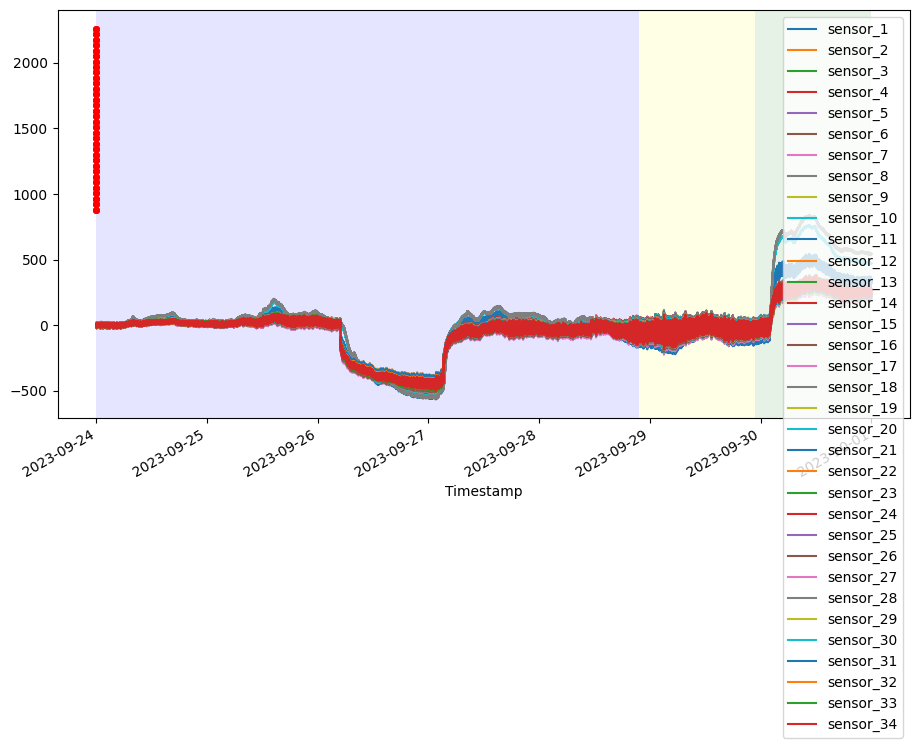

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

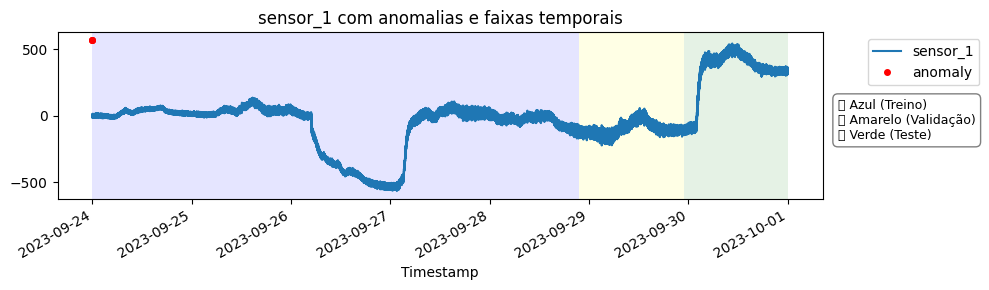

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

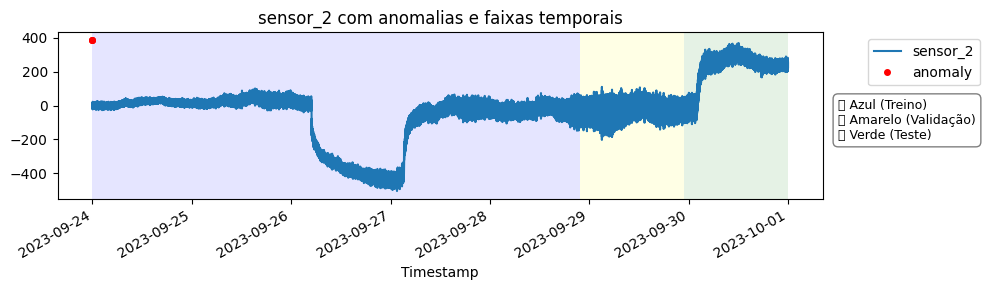

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

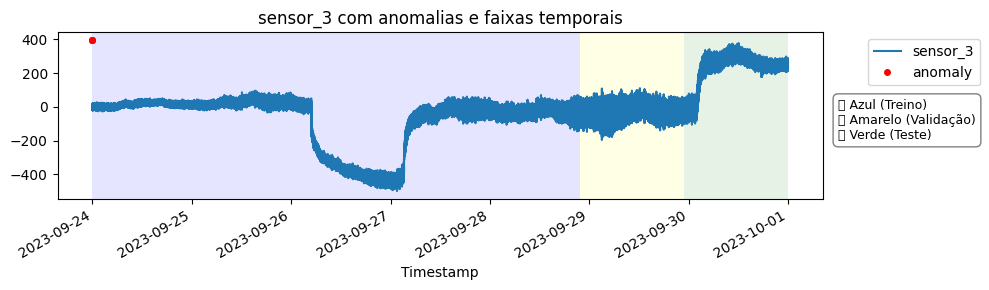

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

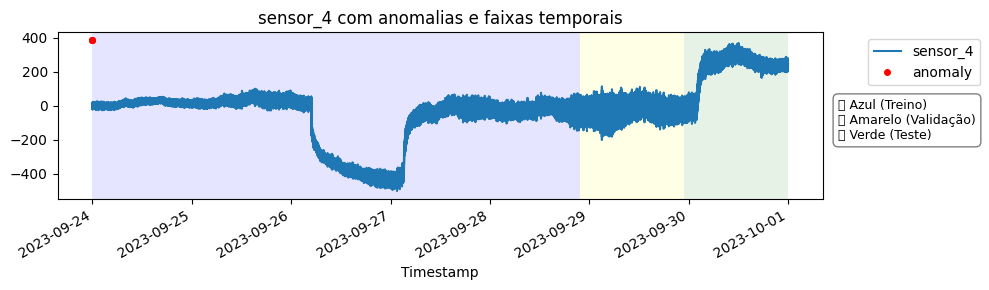

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

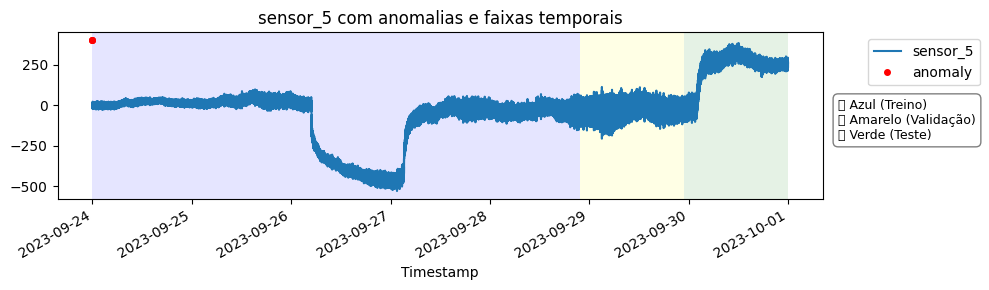

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

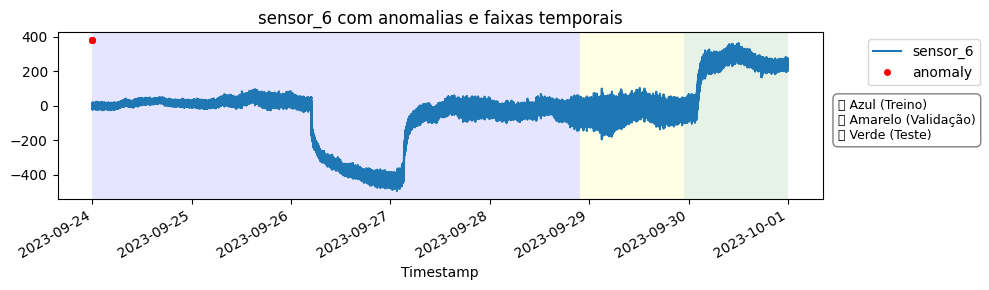

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

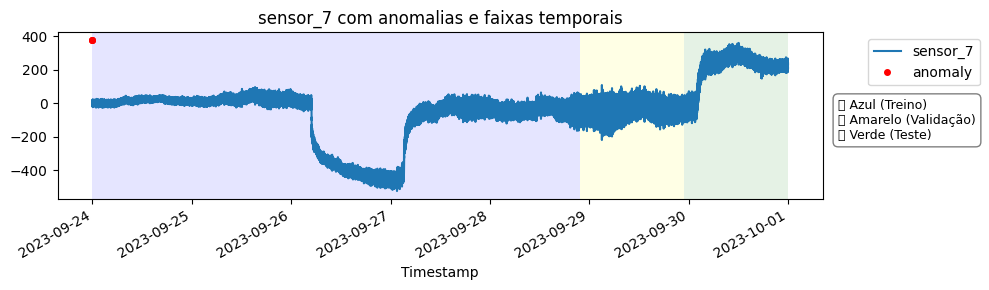

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

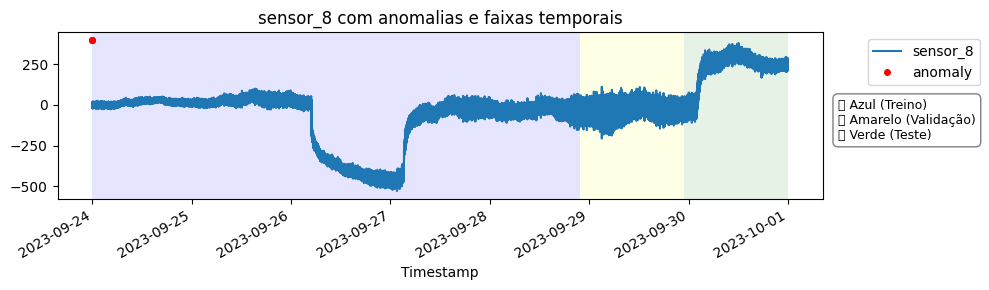

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

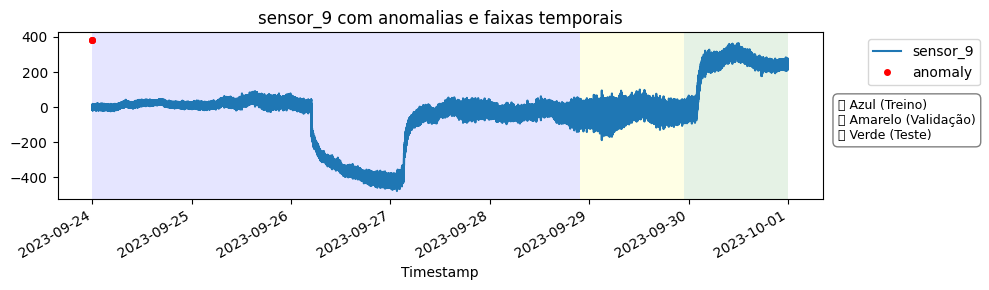

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

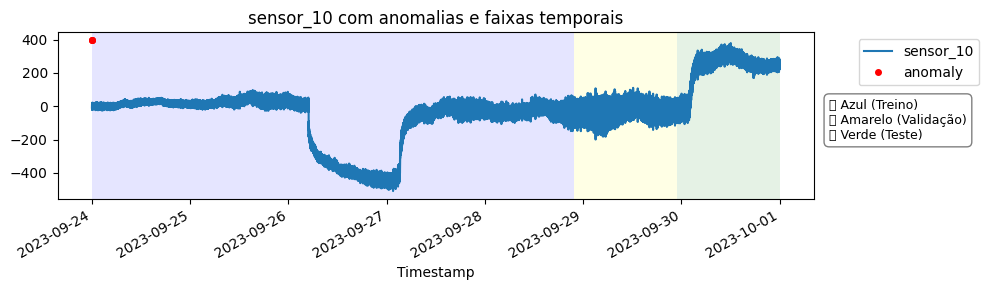

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

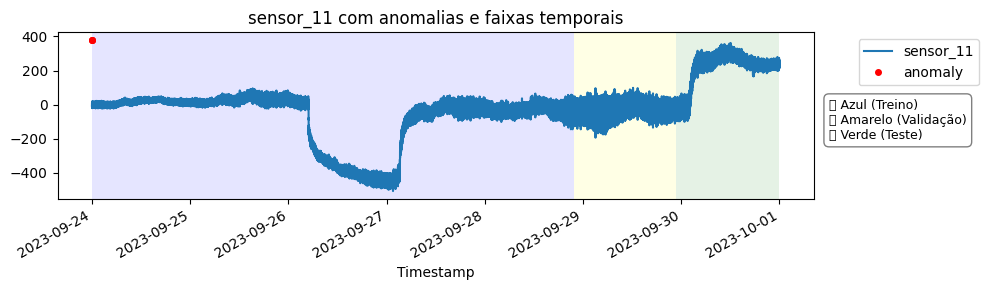

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

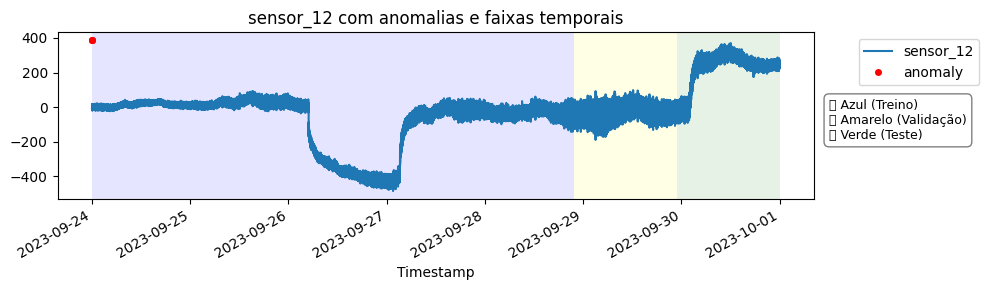

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

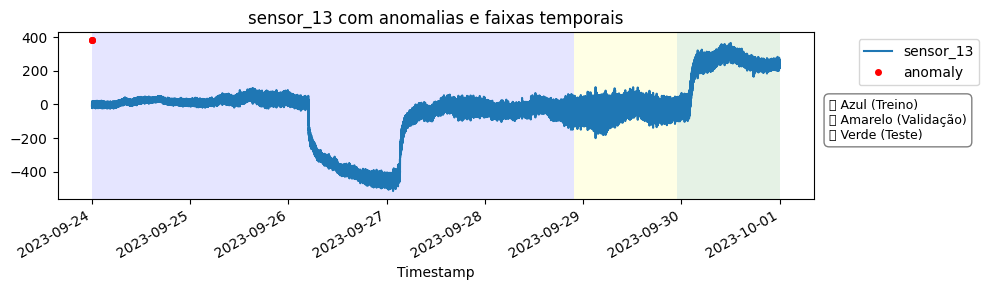

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

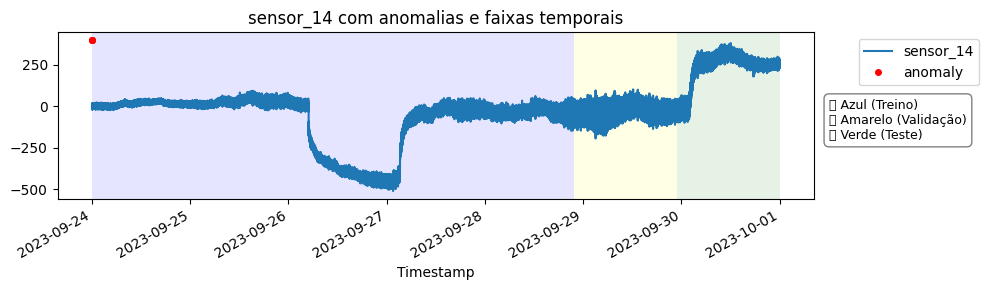

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

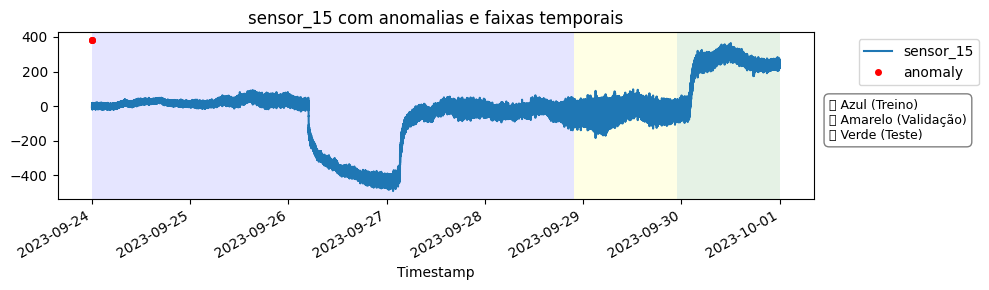

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

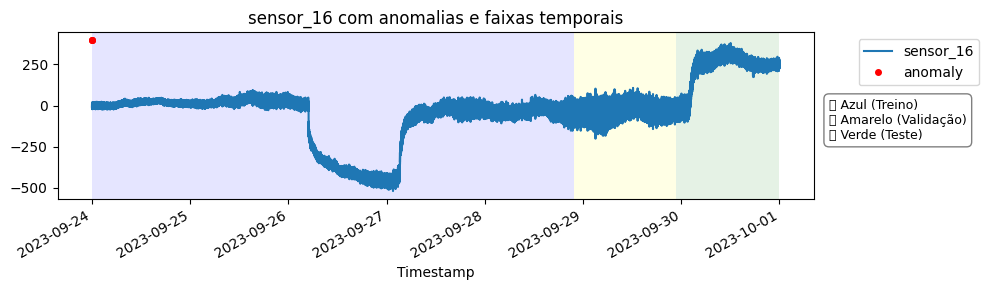

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

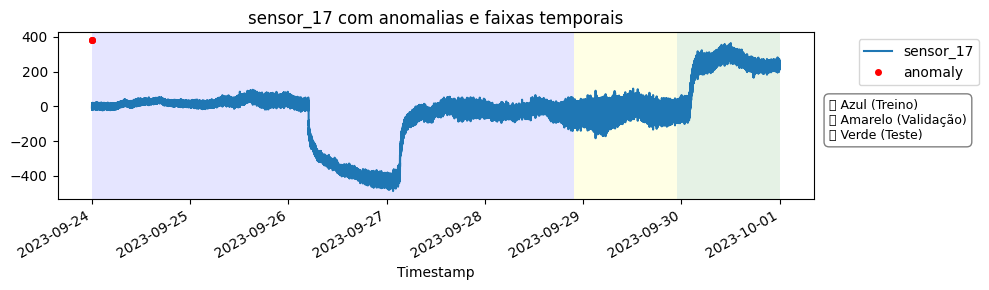

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

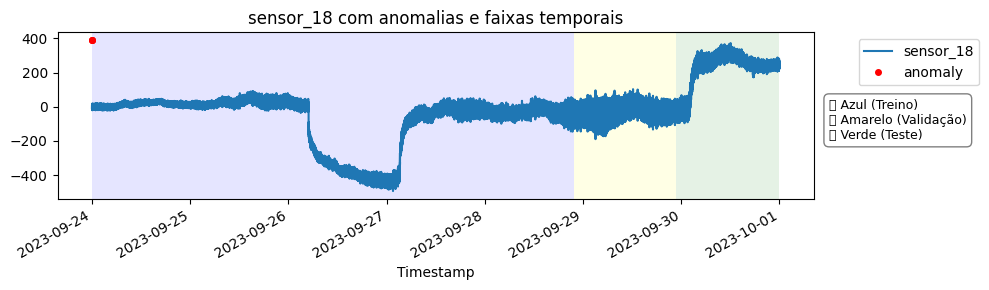

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

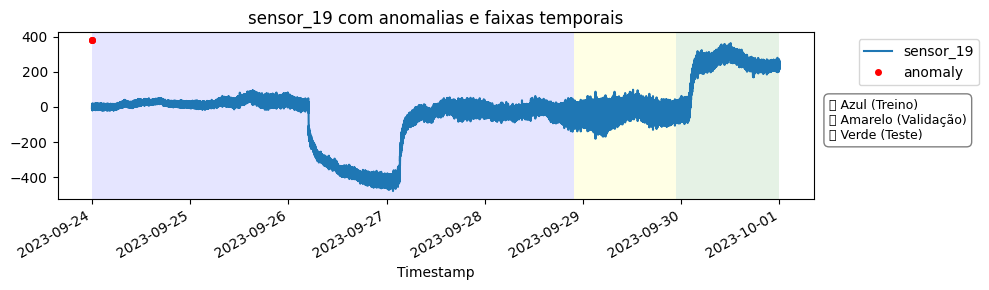

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

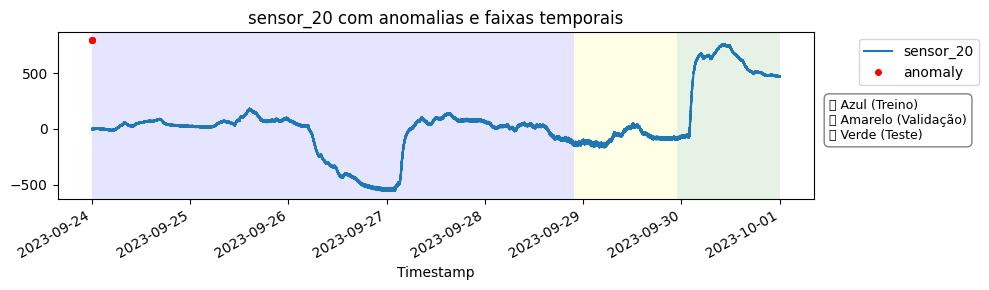

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

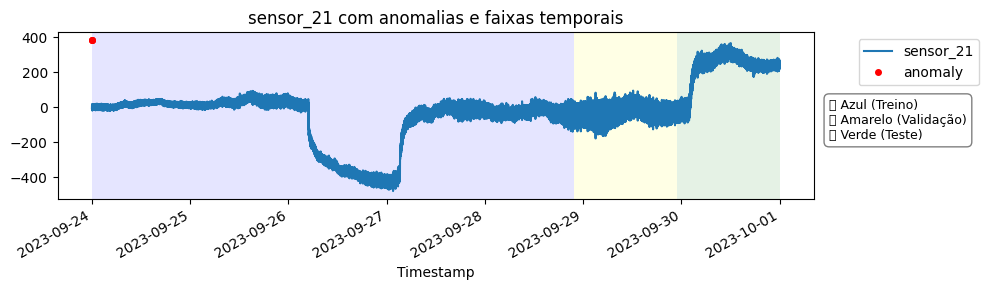

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

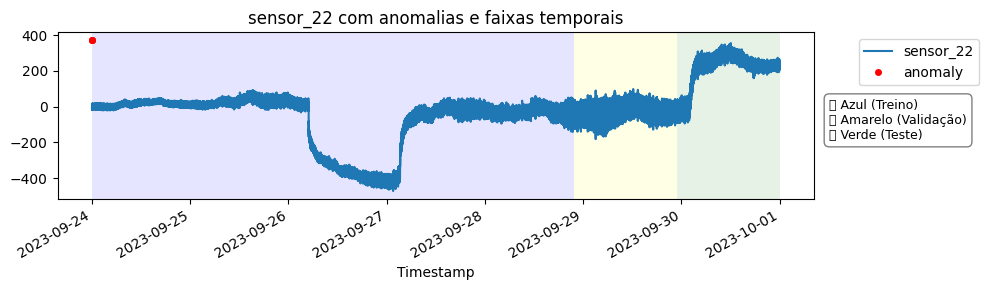

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

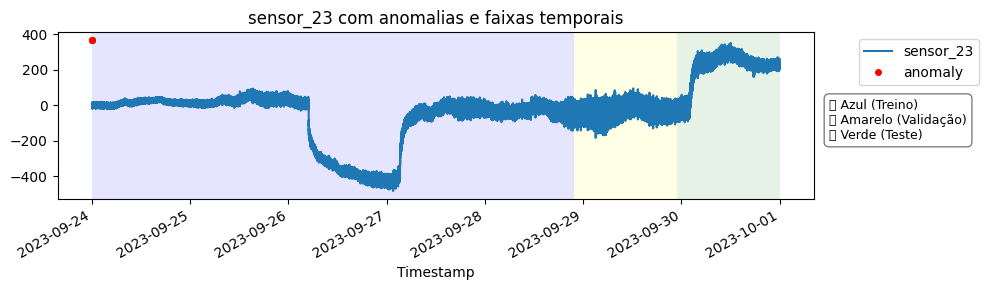

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

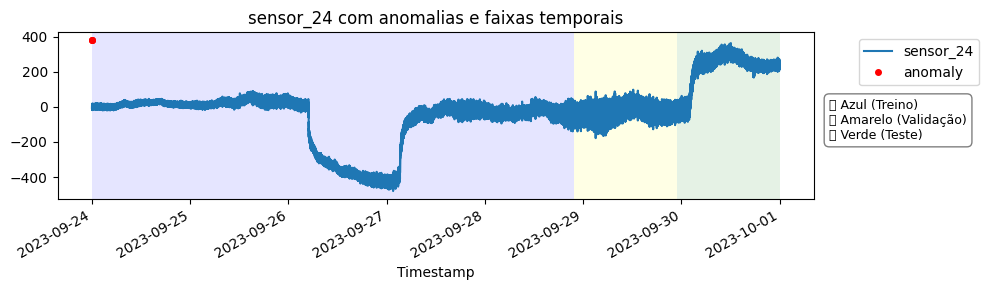

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

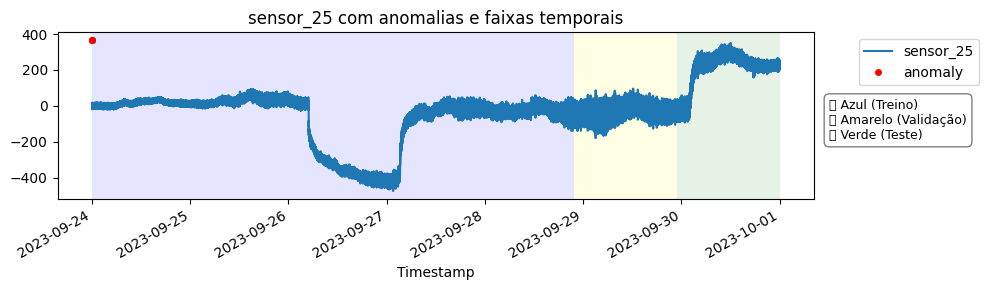

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

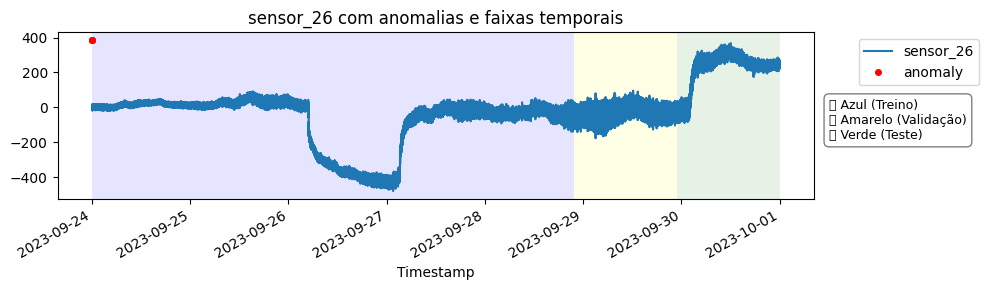

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

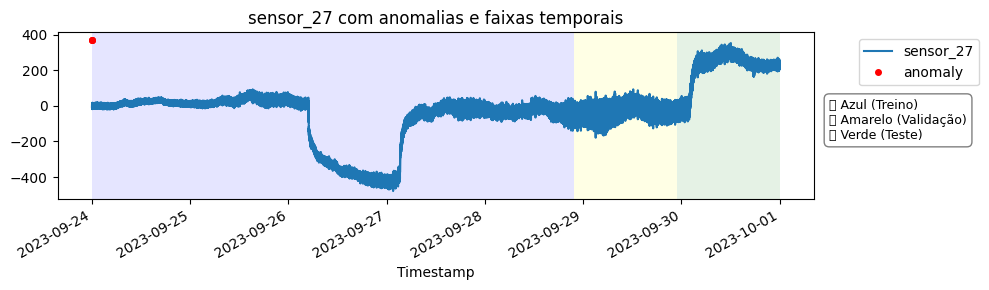

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

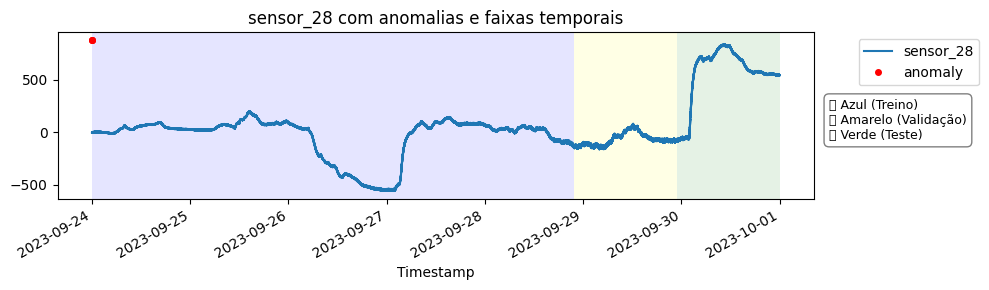

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

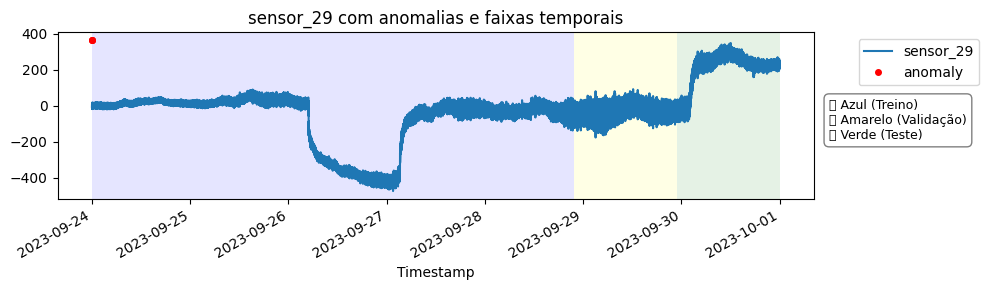

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

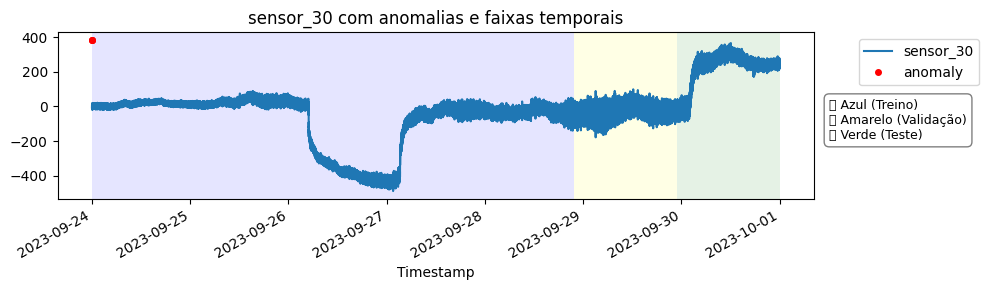

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

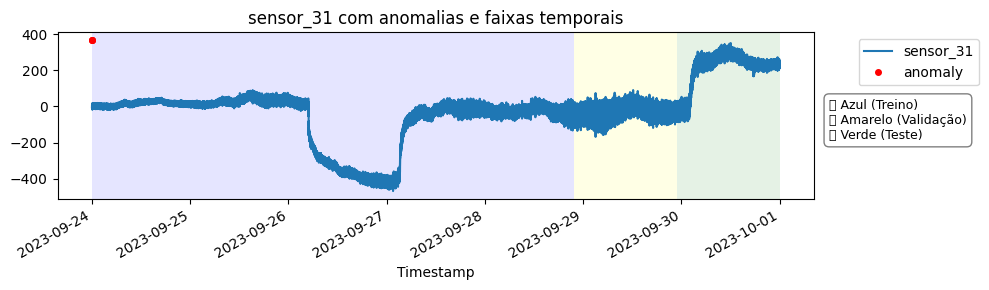

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

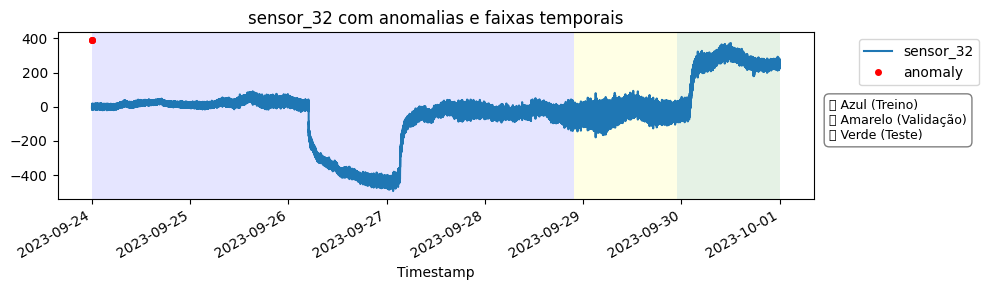

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

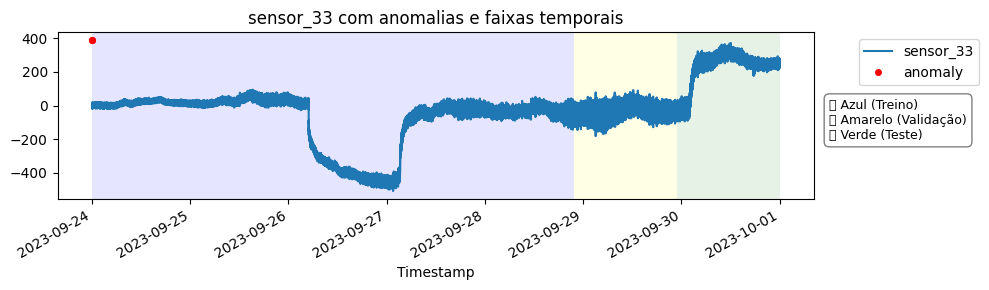

/tmp/ipython-input-1335758686.py:17: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1335758686.py:36: UserWarning: Glyph 129001 (\N{LARGE GREEN SQUARE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128998 (\N{LARGE BLUE SQUARE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129000 (\N{LARGE YELLOW SQUARE}) missing from font(s) DejaVu S

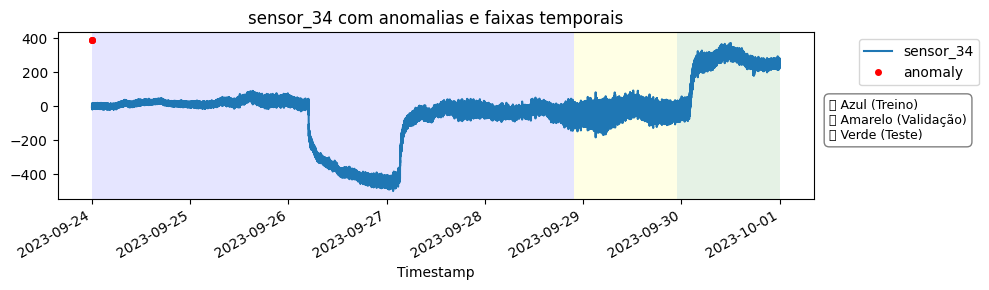

In [2]:
for i in range(1, 35):
    sensor_name = f'sensor_{i}'
    if sensor_name not in data.columns:
        continue  # pular se o sensor não existir

    fig, ax = plt.subplots(figsize=(10, 3))

    # Plot do sensor
    data[sensor_name].plot(ax=ax, label=sensor_name)

    # Valor máximo para deslocar os pontos vermelhos
    max_val = data[sensor_name].max()
    y_offset = max_val * 0.05
    y_pos = [max_val + y_offset] * len(anomaly_points)

    # Plot dos pontos vermelhos
    ax.plot(anomaly_points.index, y_pos, 'ro', markersize=4, label='anomaly')

    # Faixas coloridas
    ax.axvspan(timestamps[0], t1, facecolor='blue', alpha=0.1)
    ax.axvspan(t1, t2, facecolor='yellow', alpha=0.1)
    ax.axvspan(t2, t3, facecolor='green', alpha=0.1)

    # Título e legenda
    ax.set_title(f'{sensor_name} com anomalias e faixas temporais')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Caixa de texto explicativa no canto direito
    ax.text(1.02, 0.6,
            '🟦 Azul (Treino)\n🟨 Amarelo (Validação)\n🟩 Verde (Teste)',
            transform=ax.transAxes,
            fontsize=9,
            verticalalignment='top',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor='gray'))

    plt.tight_layout()
    plt.show()
